In [6]:
import torch
import matplotlib.pyplot as plt
from datasets import load_dataset
from transformers import ViTForImageClassification, ViTImageProcessor
import torchvision.transforms as transforms
import seaborn as sns
import numpy as np
from collections import Counter
import matplotlib.gridspec as gridspec
import scipy.ndimage as ndimage


# finetuned CIFAR

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
vit_model = 'nateraw/vit-base-patch16-224-cifar10'
model = ViTForImageClassification.from_pretrained(vit_model, output_hidden_states=True).to(device)
model.eval()
processor = ViTImageProcessor.from_pretrained(vit_model)
to_pil = transforms.ToPILImage()

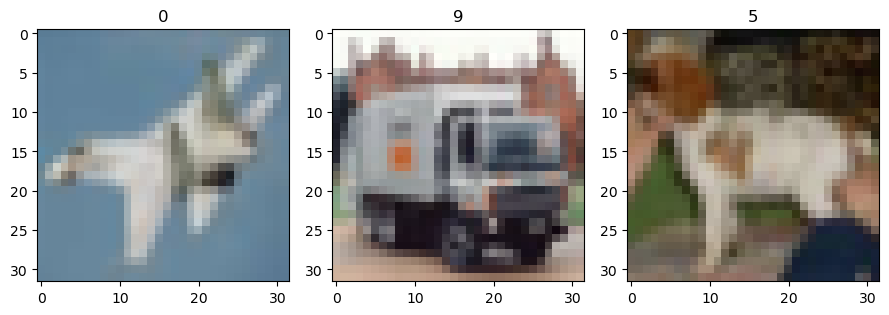

In [8]:
dataset = load_dataset("cifar10", split="test[10:13]")
images = dataset[:3]["img"]
labels = dataset[:3]["label"]
fig, axes = plt.subplots(1, 3, figsize=(9, 3))
for i in range(3):
    axes[i].set_title(labels[i])
    axes[i].imshow(images[i])

plt.tight_layout()
plt.show()

inputs = processor(images=images, return_tensors="pt").pixel_values.to(device)

## Look into individual features activated of original vit model without SAE

In [9]:
def vit_activation(model, input_image, layer_number, device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')):
    if isinstance(input_image, torch.Tensor):
        input_image = transforms.ToPILImage()(input_image) 
    
    model.to(device)
    model.eval()    
    with torch.no_grad():
        inputs = processor(images=input_image, return_tensors="pt").to(device)
        outputs = model(**inputs, output_hidden_states=True)
        hidden_states = outputs.hidden_states[layer_number+1]
    
    activation = hidden_states.squeeze(0)[1:,:]
    mean_hidden = activation.mean(dim=0).cpu().numpy()
    mean_activation = activation.mean(dim=1)

    # Define heatmap
    heatmap = mean_activation.view(14, -1).detach().cpu().numpy()
    plt.imshow(heatmap, cmap='jet')
    input_image = transforms.ToTensor()(input_image)
    # Calculate the zoom factor
    zoom_factor = input_image.shape[1] / heatmap.shape[0], input_image.shape[2] / heatmap.shape[1]

    # Resize the heatmap
    heatmap_resized = ndimage.zoom(heatmap, zoom_factor)

    # Create a gridspec object
    gs = gridspec.GridSpec(2, 3)

    # Create the subplots
    ax1 = plt.subplot(gs[0, 0])
    ax2 = plt.subplot(gs[0, 1])
    ax3 = plt.subplot(gs[0, 2])
    ax4 = plt.subplot(gs[1, :])  # This subplot spans all columns in the second row

    ax1.imshow(input_image.permute(1,2,0))
    ax1.set_title('Original Image')
    ax1.axis('off')

    ax2.imshow(heatmap_resized, cmap='jet')
    ax2.set_title('Heatmap')
    ax2.axis('off')

    ax3.imshow(input_image.permute(1,2,0))
    ax3.imshow(heatmap_resized, cmap='jet', alpha=0.5)
    ax3.set_title('Overlay')

    ax4.bar(range(len(mean_hidden)), mean_hidden, ec='blue')
    ax4.set_title('Activation level of SAE')
    ax4.set_xlabel('Neuron')
    ax4.set_ylabel('Activation level')
    max_height = mean_hidden.max()*1.1
    ax4.set_ylim(0, max_height)
    plt.tight_layout()
    
    plt.show()
    

layer 0


/tmp/ipykernel_1490089/3868291194.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(gs[0, 0])


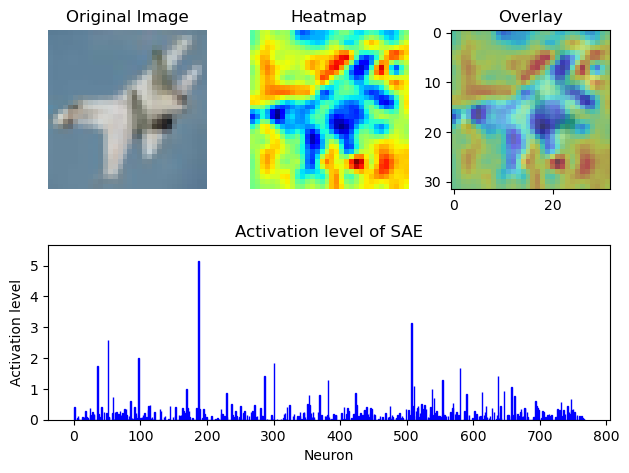

layer 1


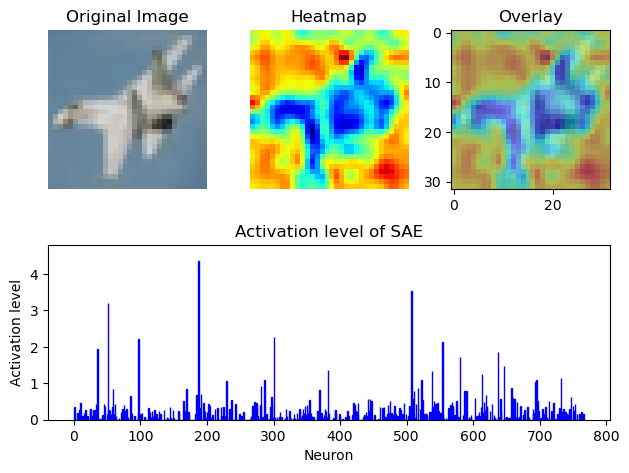

layer 2


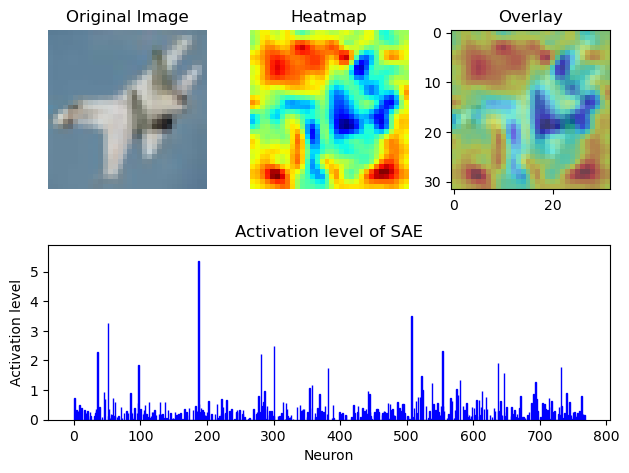

layer 3


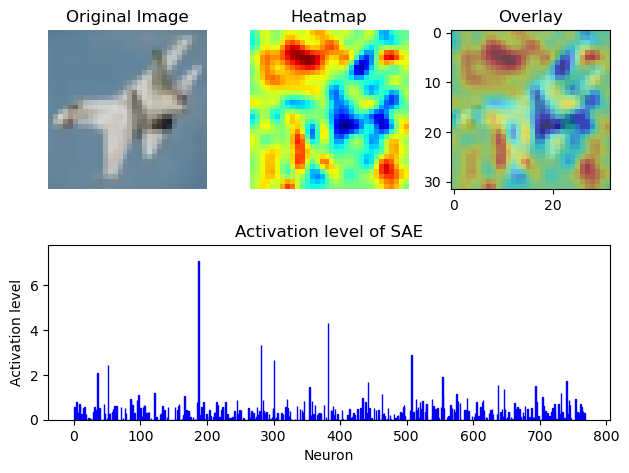

layer 4


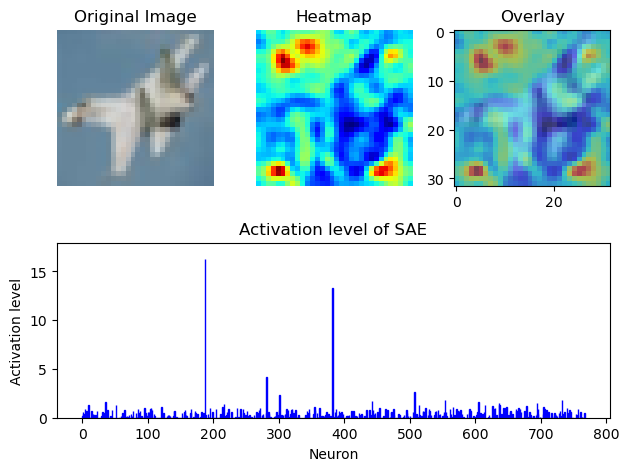

layer 5


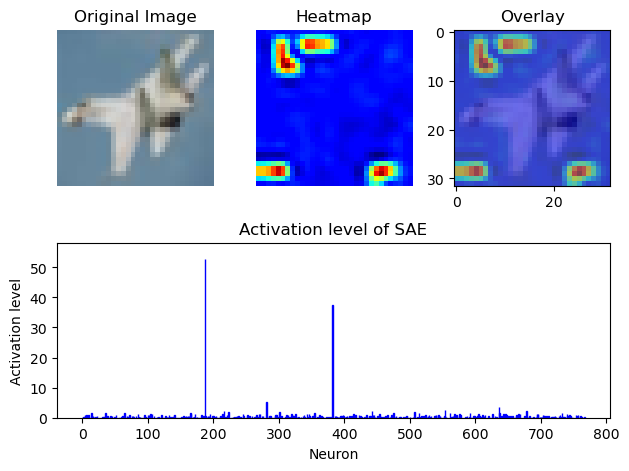

layer 6


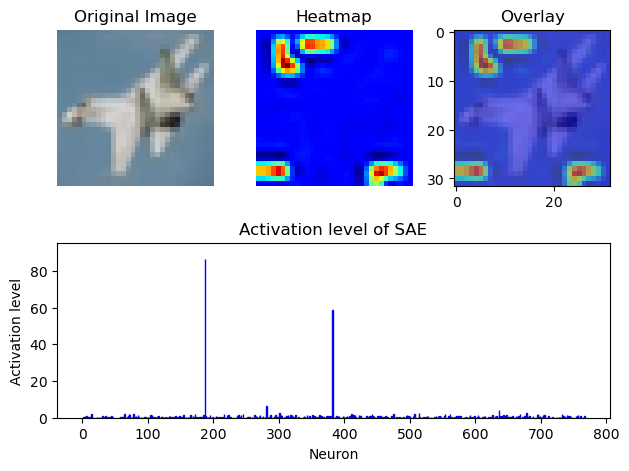

layer 7


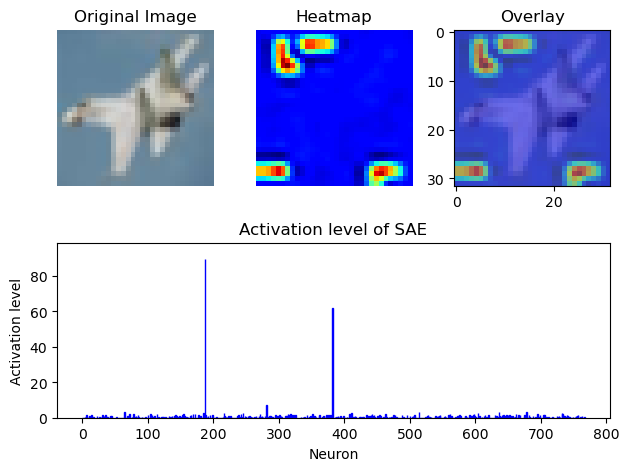

layer 8


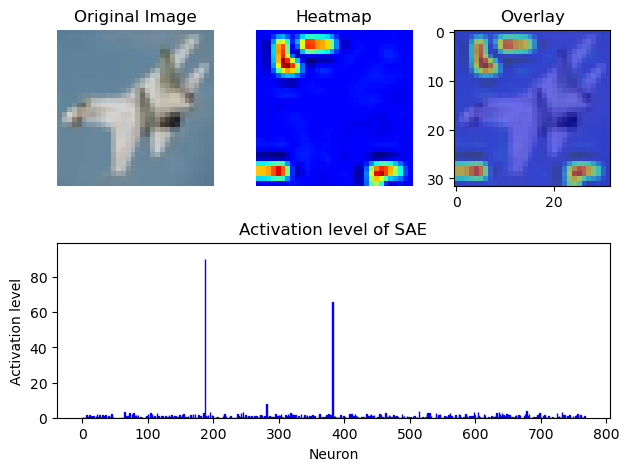

layer 9


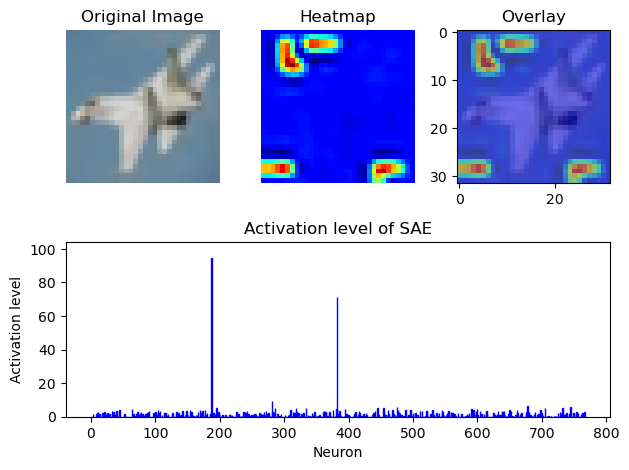

layer 10


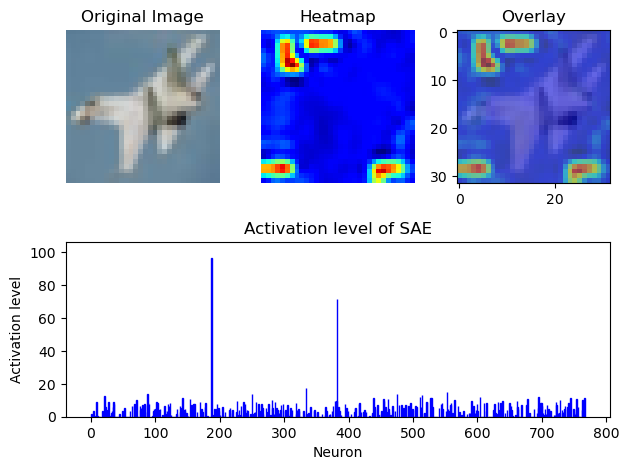

layer 11


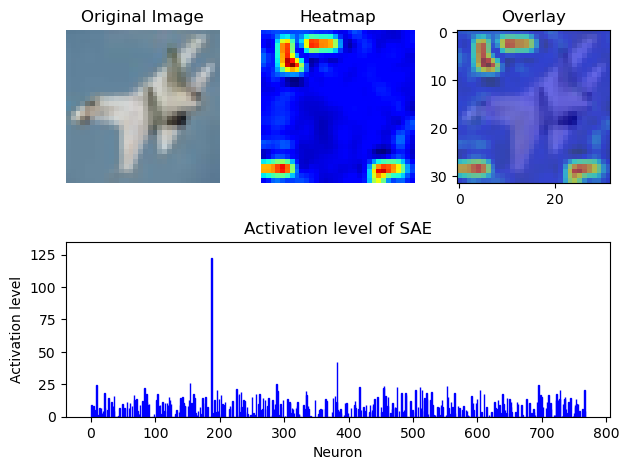

layer 0


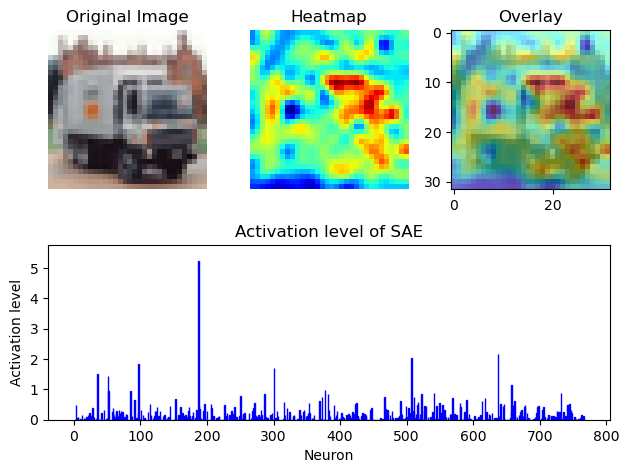

layer 1


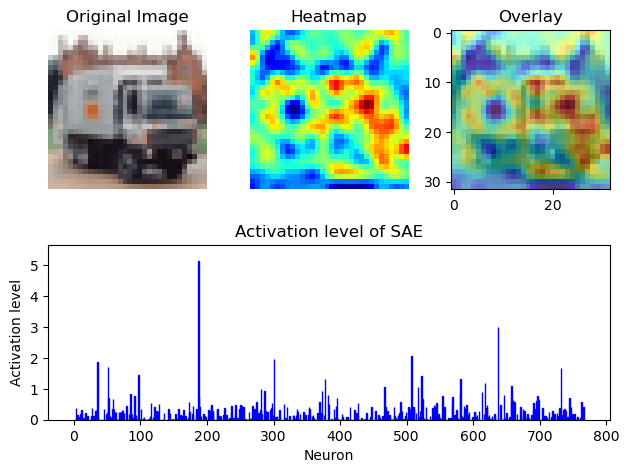

layer 2


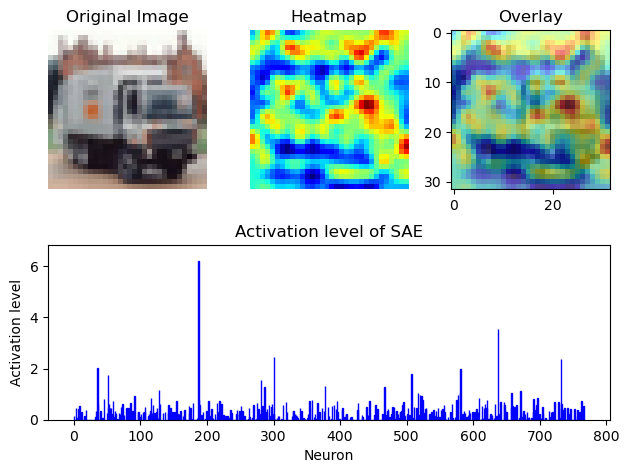

layer 3


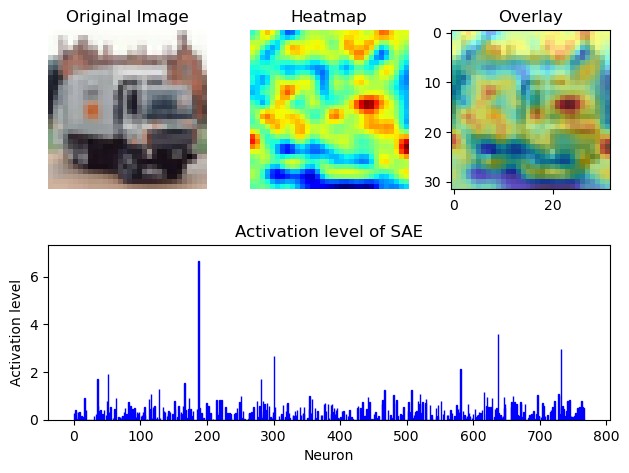

layer 4


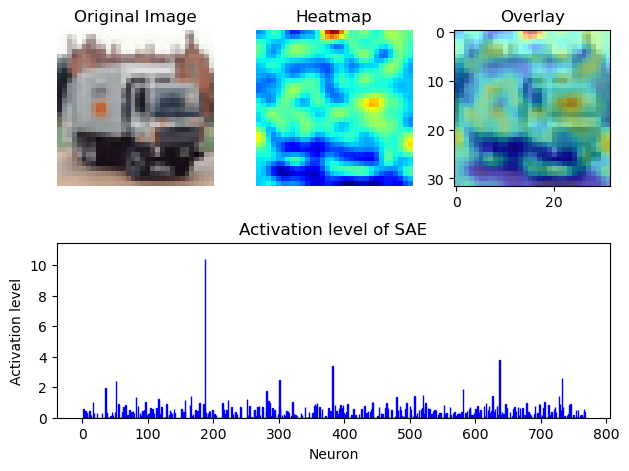

layer 5


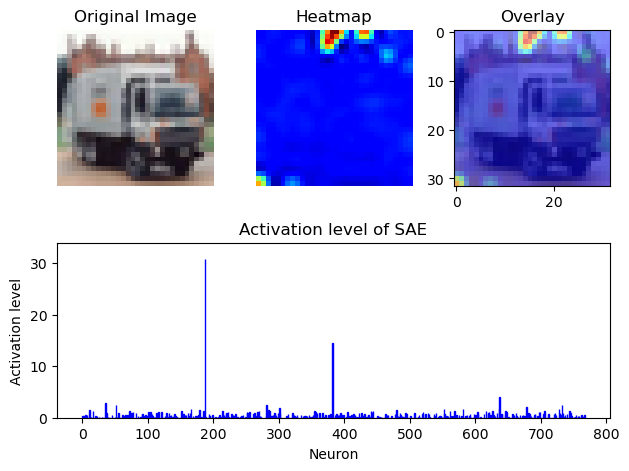

layer 6


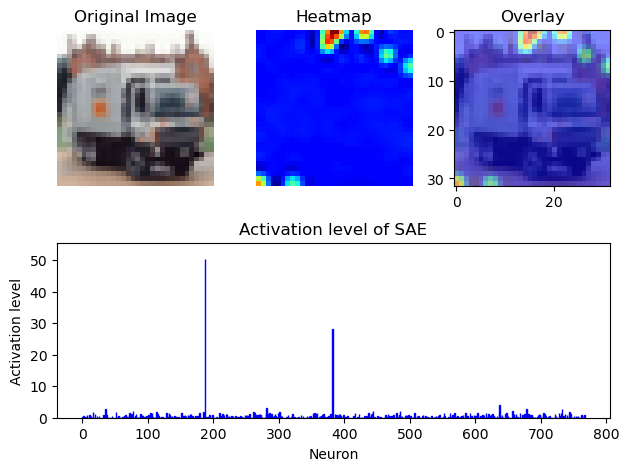

layer 7


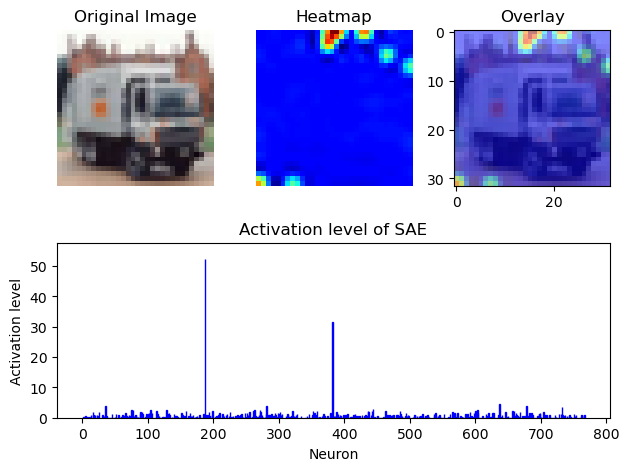

layer 8


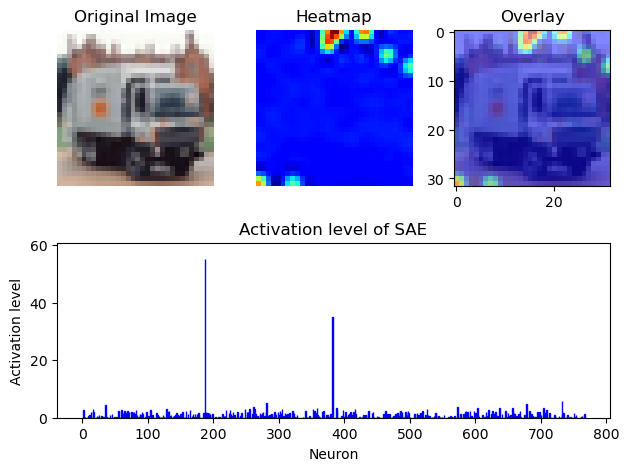

layer 9


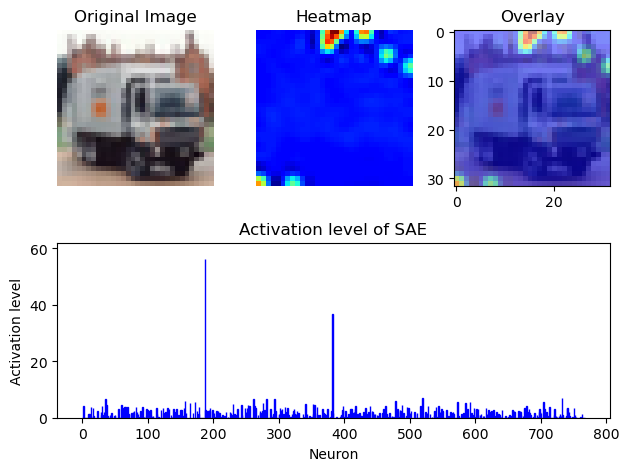

layer 10


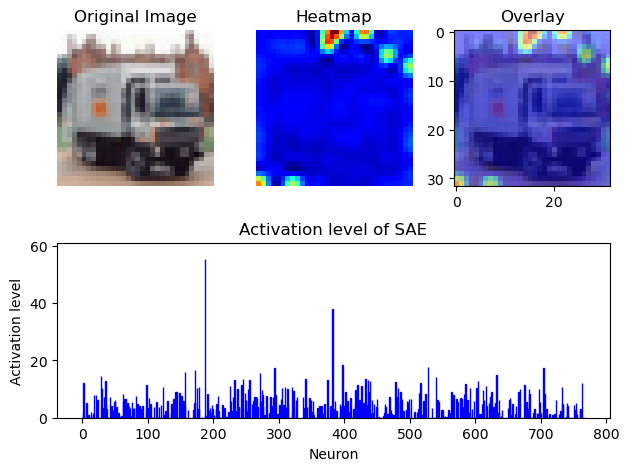

layer 11


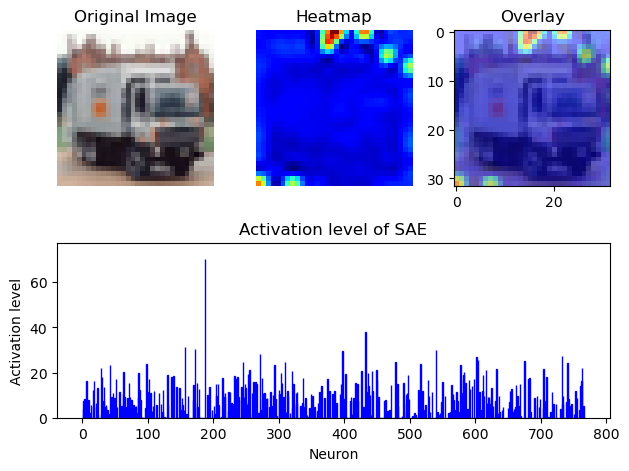

In [10]:
#run for all layers model ratio 10
for i in range(12):
    print(f'layer {i}')
    vit_activation(model, images[0],layer_number = i, device= device)

for i in range(12):
    print(f'layer {i}')
    vit_activation(model, images[1],layer_number = i, device= device)

## Look into most activated features in All layers

In [11]:
activations_1 = model(inputs[0].unsqueeze(0))['hidden_states'][1:]
activations_2 = model(inputs[1].unsqueeze(0))['hidden_states'][1:]
activations_3 = model(inputs[2].unsqueeze(0))['hidden_states'][1:]

In [12]:
activations_1[0].shape

torch.Size([1, 197, 768])

In [13]:

top_features1 = []
top_features2 = []
top_features3 = []
for i in range(12):
    # Detach the tensors before passing them to torch.topk()
    tensor1 = activations_1[i].squeeze().mean(dim=0).detach().cpu()
    tensor2 = activations_2[i].squeeze().mean(dim=0).detach().cpu()
    tensor3 = activations_3[i].squeeze().mean(dim=0).detach().cpu()

    top_features1.append(torch.topk(tensor1, k=10, largest=True).indices)
    top_features2.append(torch.topk(tensor2, k=10, largest=True).indices)
    top_features3.append(torch.topk(tensor3, k=10, largest=True).indices)

In [14]:

print("Image 1")
[print(i) for i in top_features1]

print("Image 2")
[print(i) for i in top_features2]

print("Image 3")
[print(i) for i in top_features3]

Image 1
tensor([187, 507,  51,  97, 301,  35, 580, 637, 286, 382])
tensor([187, 507,  51, 301,  97, 554,  35, 637, 580, 646])
tensor([187, 507,  51, 301, 554,  35, 281, 637,  97, 382])
tensor([187, 382, 281, 507, 301,  51,  35, 554, 740, 442])
tensor([187, 382, 281, 507, 301, 732, 554, 442, 605,  35])
tensor([187, 382, 281, 636, 554, 678, 442, 216, 507, 301])
tensor([187, 382, 281, 636, 678, 301, 514, 172, 475, 442])
tensor([187, 382, 281, 514, 636, 678,  64, 411, 604, 245])
tensor([187, 382, 281, 678, 514, 598, 195, 732,  64, 245])
tensor([187, 382, 281, 678, 475, 744, 318, 705, 732, 445])
tensor([187, 382, 334, 553, 250, 475,  88, 514,  21, 604])
tensor([187, 382, 154, 288,   9, 695, 455, 553, 475, 511])
Image 2
tensor([187, 637, 507,  97, 301,  35,  51, 658, 377,  85])
tensor([187, 637, 507, 301,  35,  51, 732,  97, 522, 377])
tensor([187, 637, 301, 732,  35, 581, 507,  51, 281, 377])
tensor([187, 637, 732, 301, 581,  51, 281,  35, 166, 128])
tensor([187, 637, 382, 732, 301,  51,  3

[None, None, None, None, None, None, None, None, None, None, None, None]

In [15]:
# extract top 10 features that activated in a input across all layers
def get_top_indices(top_features, num_top=10):
    tops = []
    for i in top_features:
        tops.append(i.cpu().detach().numpy())
    tops = np.concatenate(tops)

    # Count the occurrences of each value
    value_counts = Counter(tops)

    # Create a dictionary with value and counts
    value_counts_dict = dict(value_counts)
    sorted_counts = sorted(value_counts_dict.items(), key=lambda x: x[1], reverse=True)
    sorted_indices = [index for index, _ in sorted_counts[:num_top]]
    
    return sorted_indices

In [16]:
top_indices1 = get_top_indices(top_features1)
top_indices2 = get_top_indices(top_features2)
top_indices3 = get_top_indices(top_features3)

print(top_indices1)
print(top_indices2)
print(top_indices3)

[187, 382, 281, 301, 507, 35, 554, 678, 51, 442]
[187, 35, 732, 637, 281, 382, 301, 51, 678, 507]
[187, 281, 637, 301, 732, 382, 51, 97, 636, 35]


## create heatmaps for most activated neurons in each layer

In [17]:
activations_1[0].shape

torch.Size([1, 197, 768])

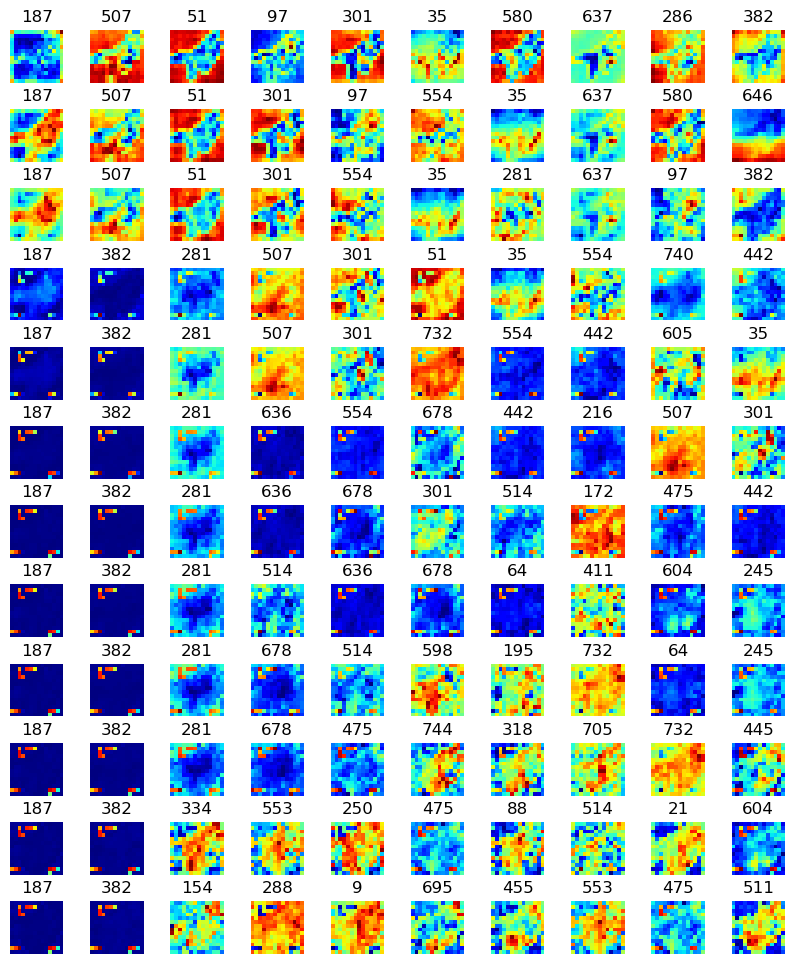

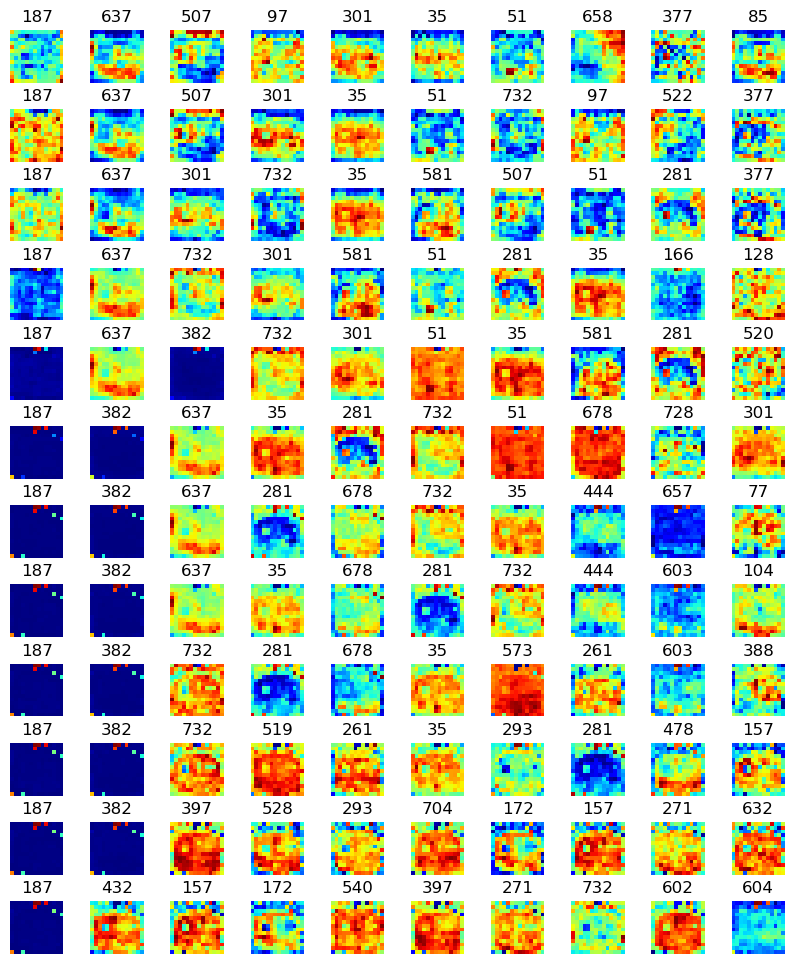

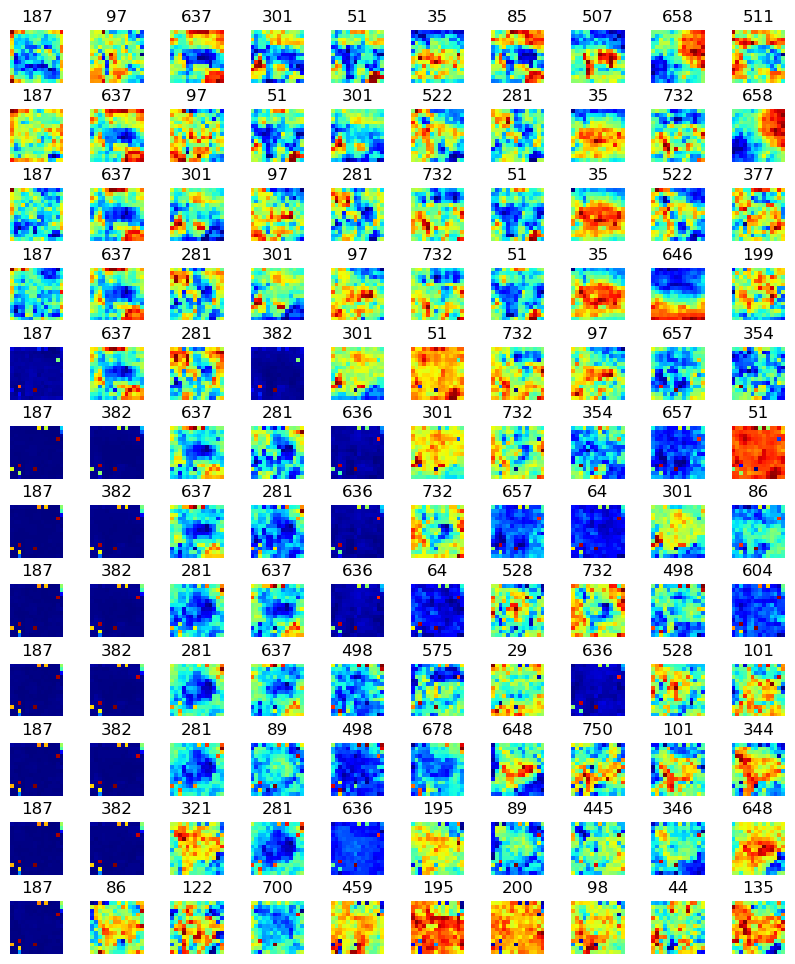

In [18]:
# Define a function to create a heatmap
def create_heatmap(activations, top_features):
    fig, axs = plt.subplots(12, 10, figsize=(10, 12))
    for i, layer_features in enumerate(top_features):
        for j, feature in enumerate(layer_features):
            ax = axs[i, j]
            sns.heatmap(activations[i].squeeze()[:,feature][1:].reshape(14,-1).detach().cpu().numpy(), cmap='jet', ax=ax, cbar=False)
            ax.set_title(f'{feature}')
            ax.axis('off')
    plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Adjust spacing between subplots
    plt.show()

# Call the function for each image
create_heatmap(activations_1, top_features1)
create_heatmap(activations_2, top_features2)
create_heatmap(activations_3, top_features3)

# Non finetuned

In [19]:
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
_ = model.to(device).eval()

In [20]:
dataset = load_dataset("Bingsu/Cat_and_Dog", split="test[998:1003]")
images = dataset[:5]["image"]
labels = dataset[:5]["labels"]

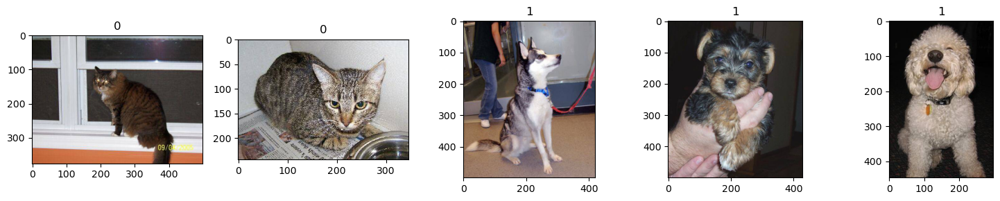

In [21]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    axes[i].set_title(labels[i])
    axes[i].imshow(images[i])

plt.tight_layout()
plt.show()

inputs = processor(images=images, return_tensors="pt").pixel_values.to(device)

image 0
layer 0


/tmp/ipykernel_1490089/3868291194.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(gs[0, 0])


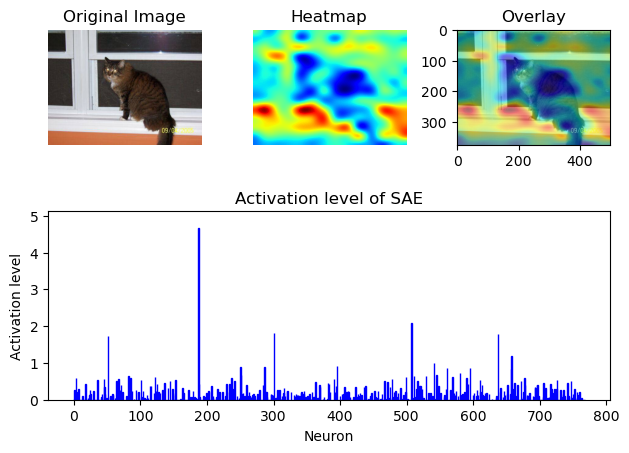

layer 1


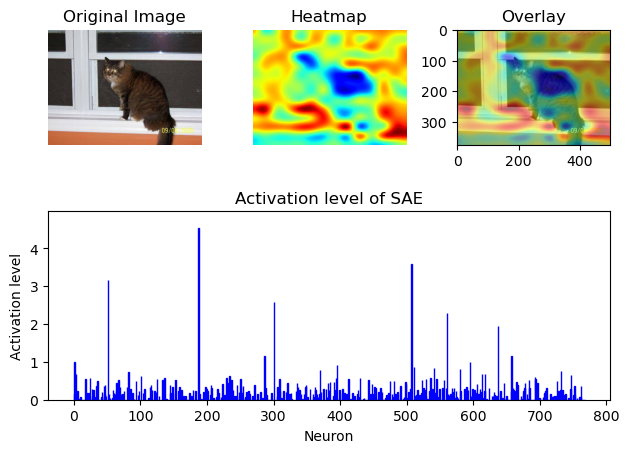

layer 2


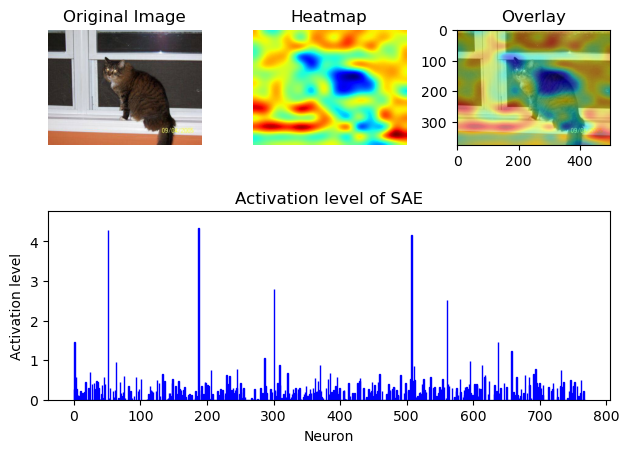

layer 3


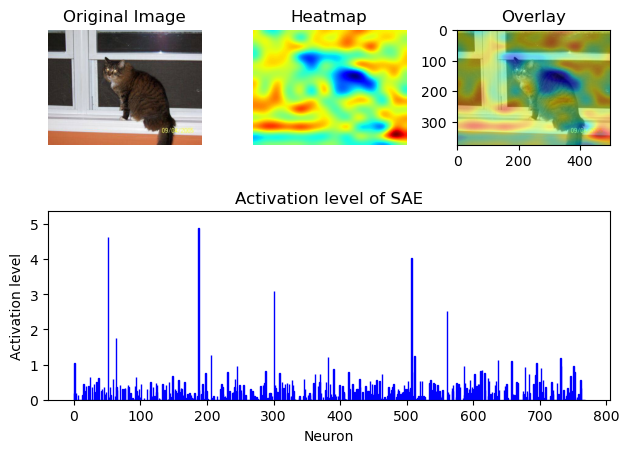

layer 4


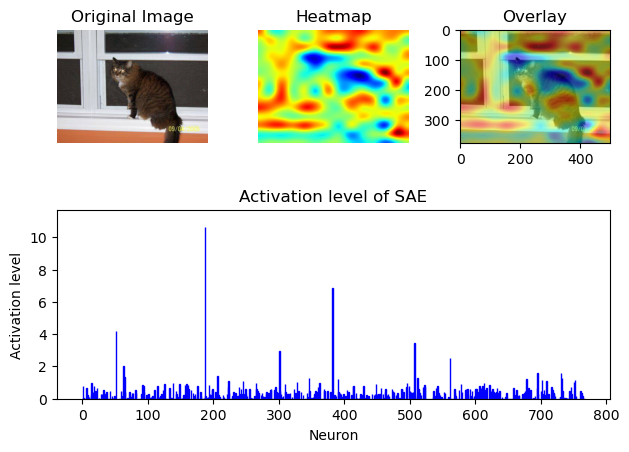

layer 5


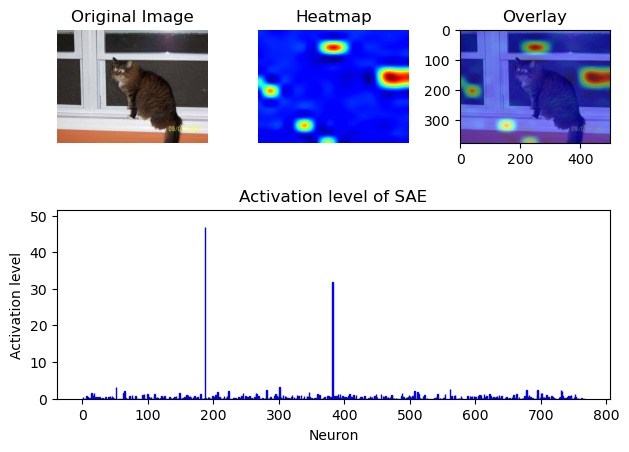

layer 6


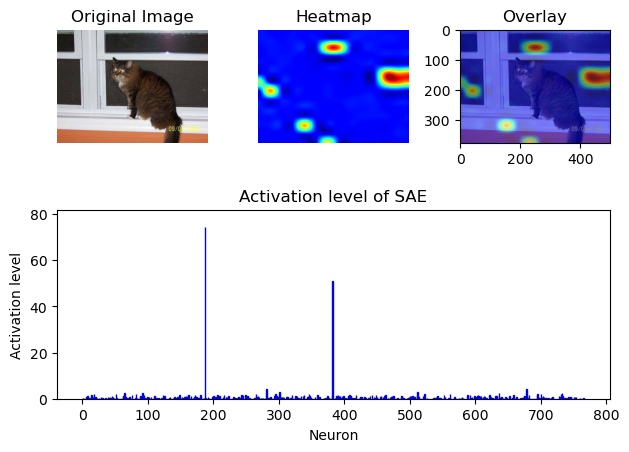

layer 7


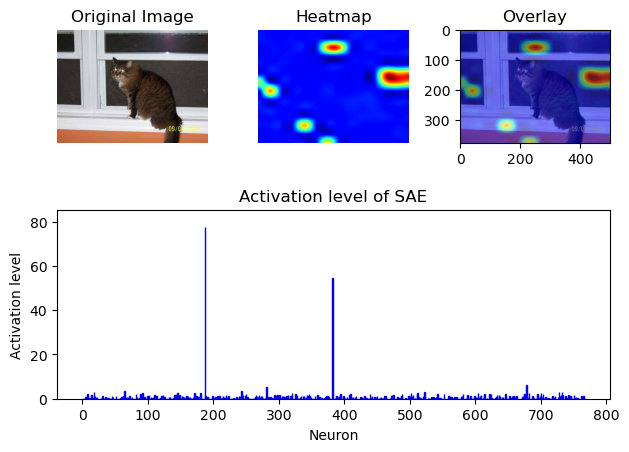

layer 8


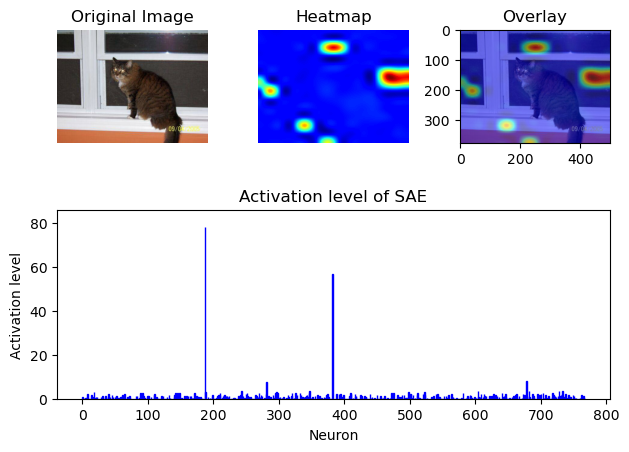

layer 9


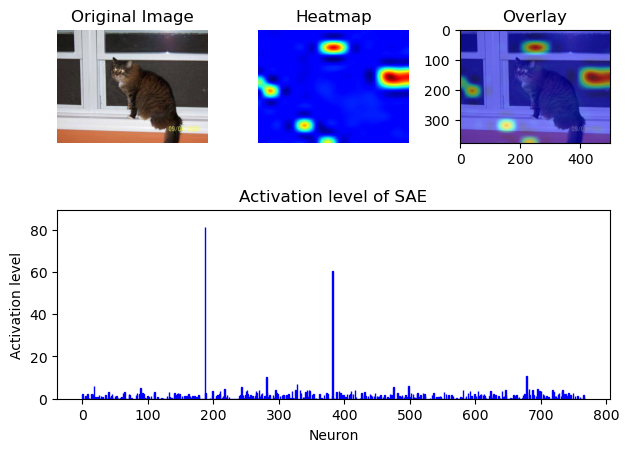

layer 10


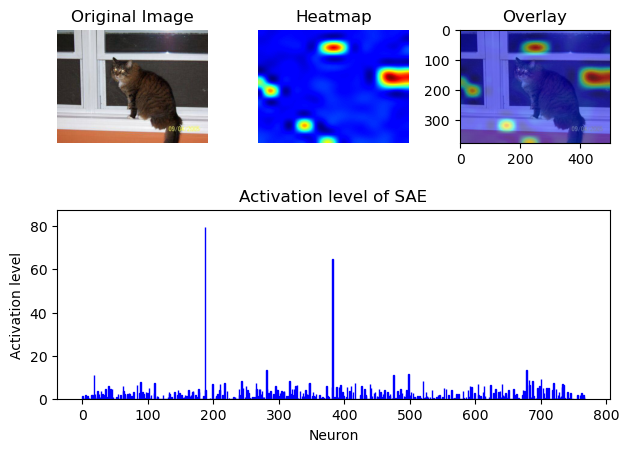

layer 11


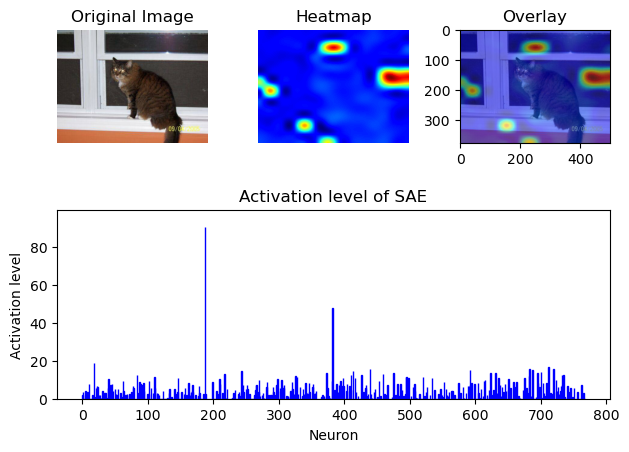

image 1
layer 0


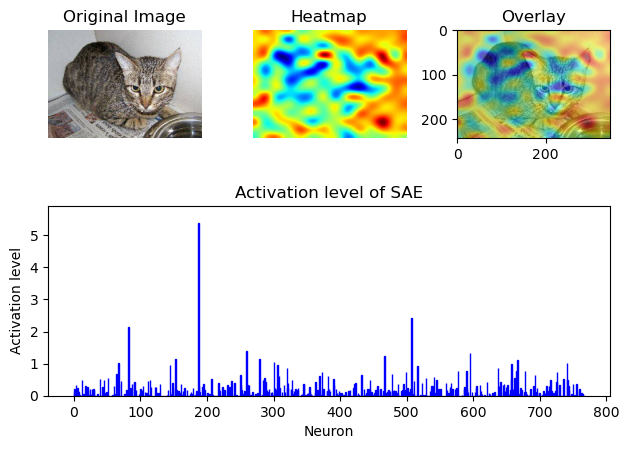

layer 1


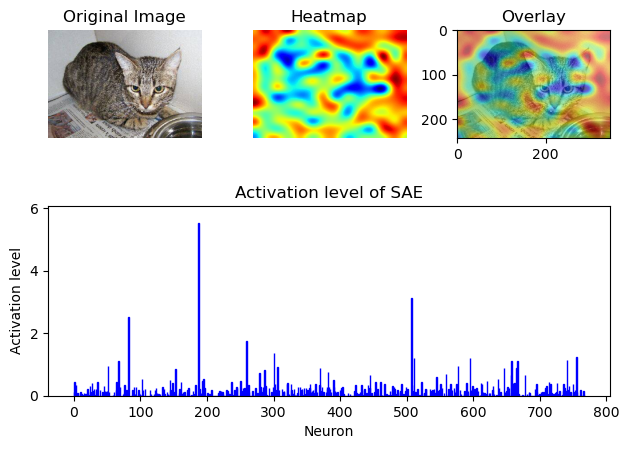

layer 2


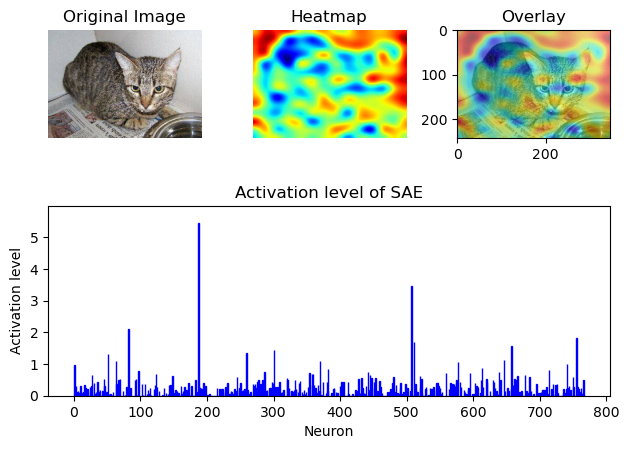

layer 3


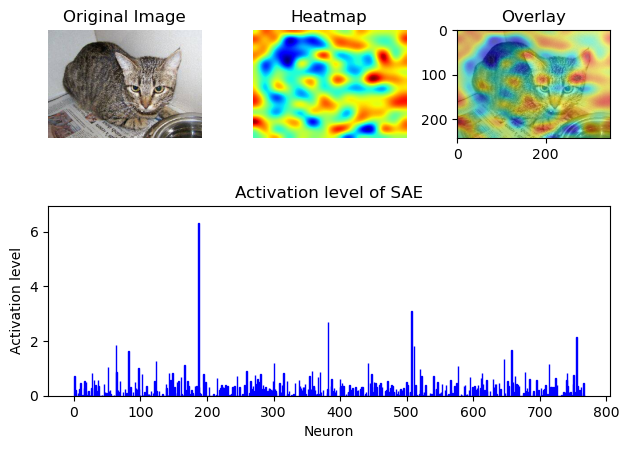

layer 4


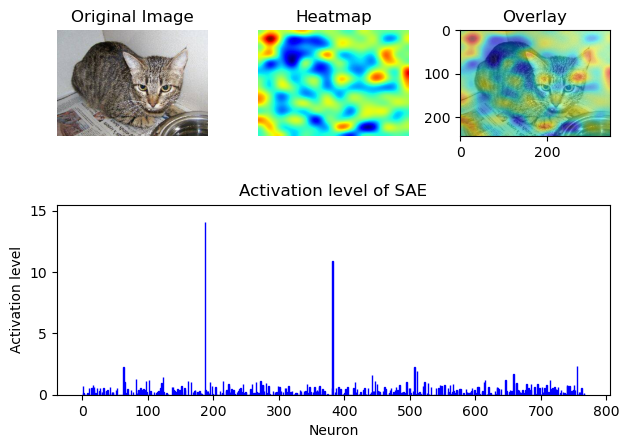

layer 5


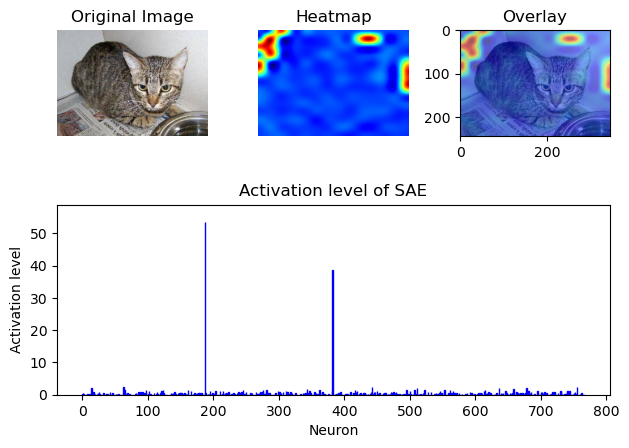

layer 6


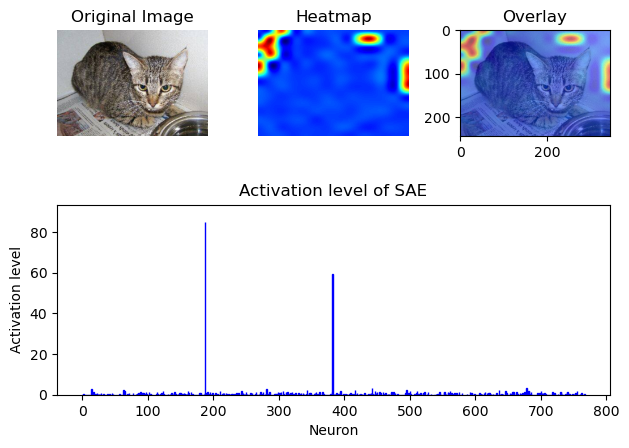

layer 7


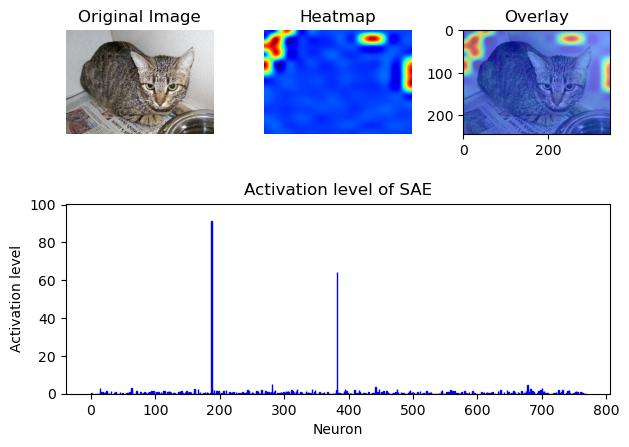

layer 8


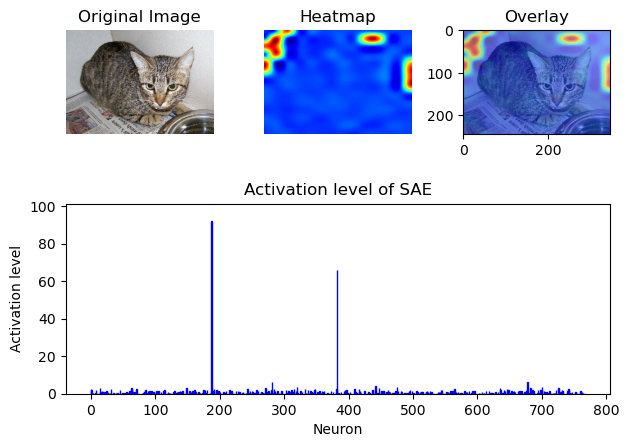

layer 9


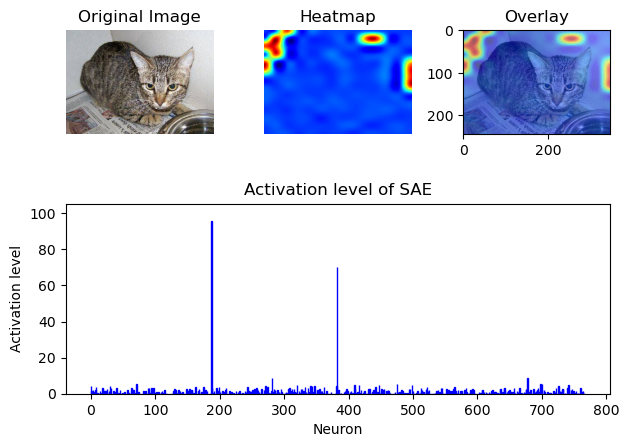

layer 10


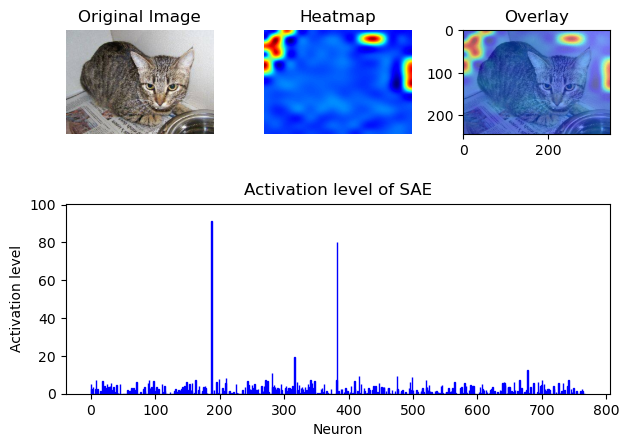

layer 11


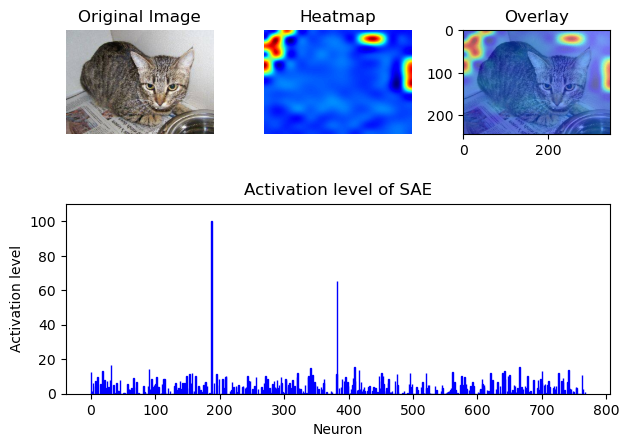

image 2
layer 0


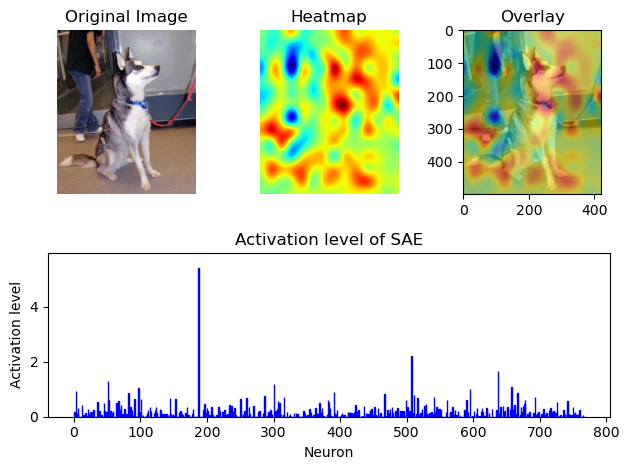

layer 1


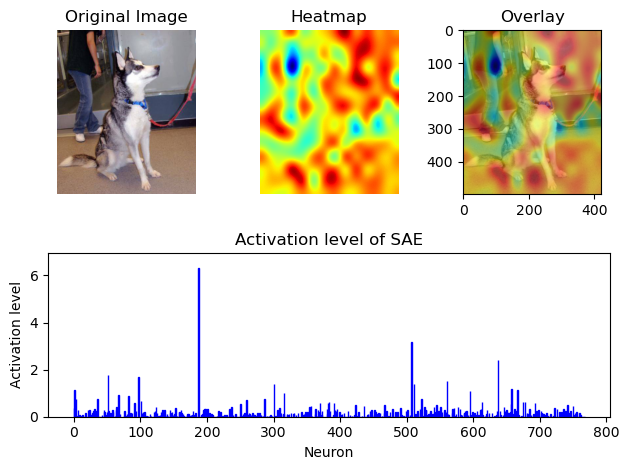

layer 2


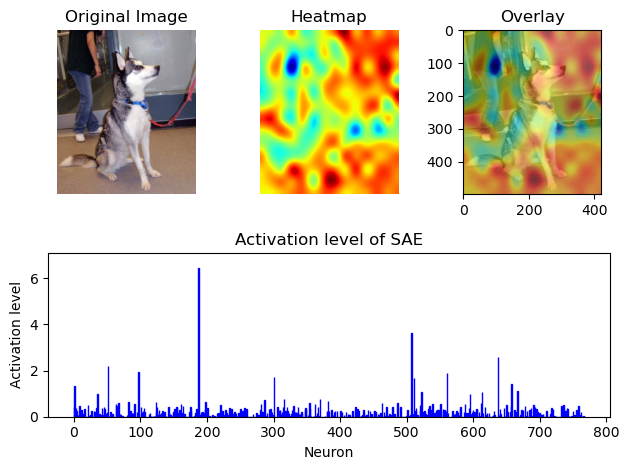

layer 3


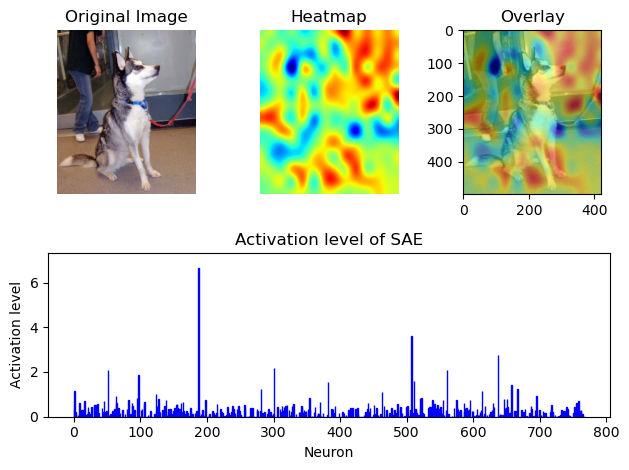

layer 4


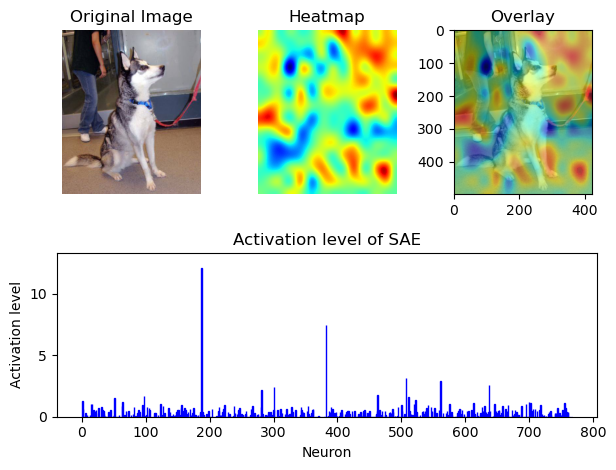

layer 5


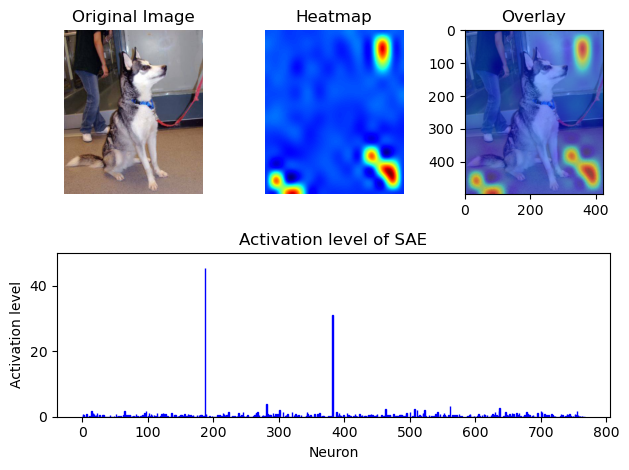

layer 6


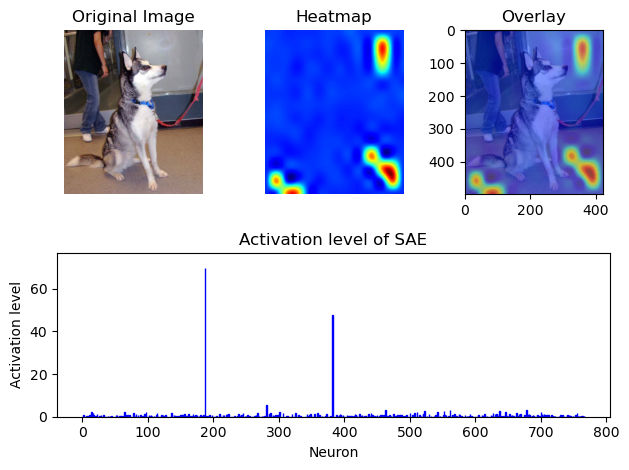

layer 7


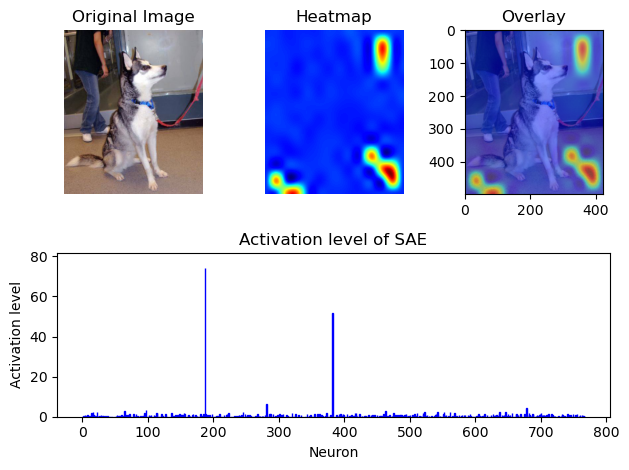

layer 8


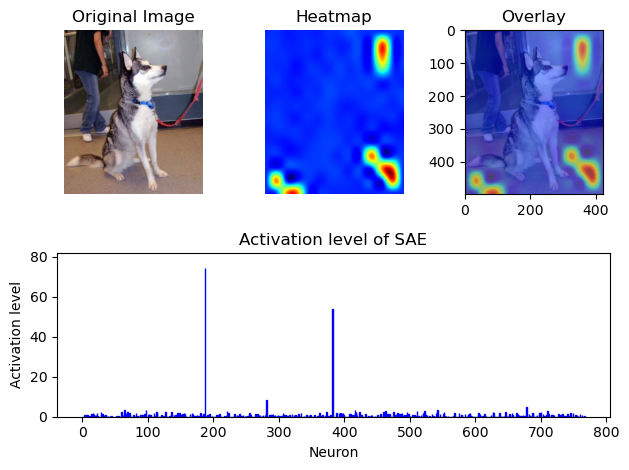

layer 9


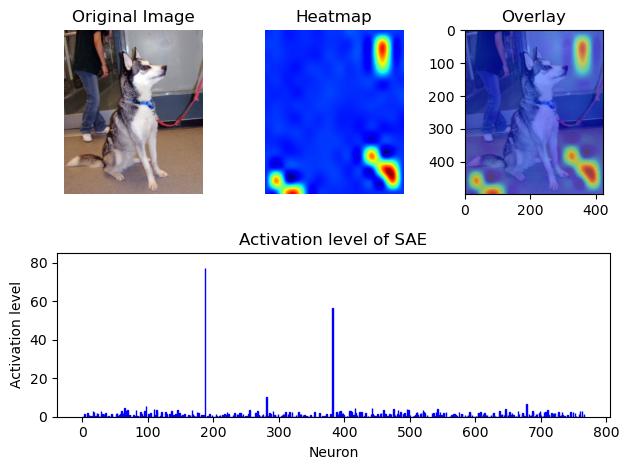

layer 10


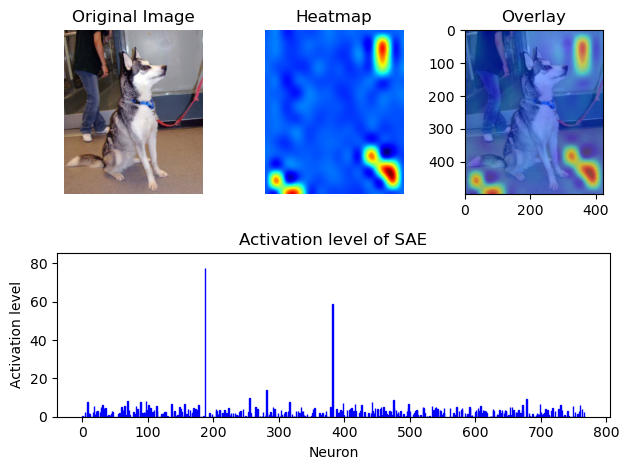

layer 11


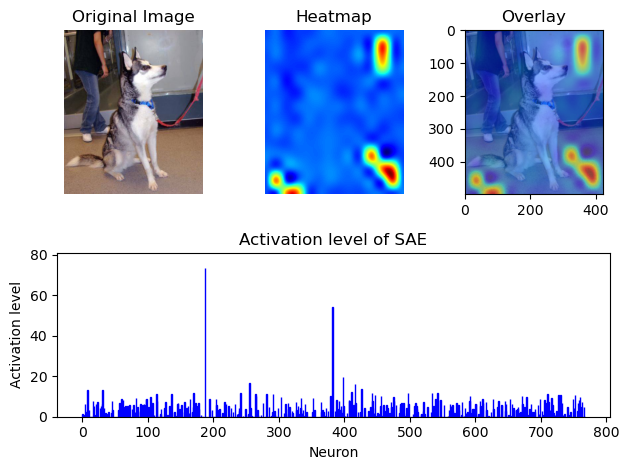

image 3
layer 0


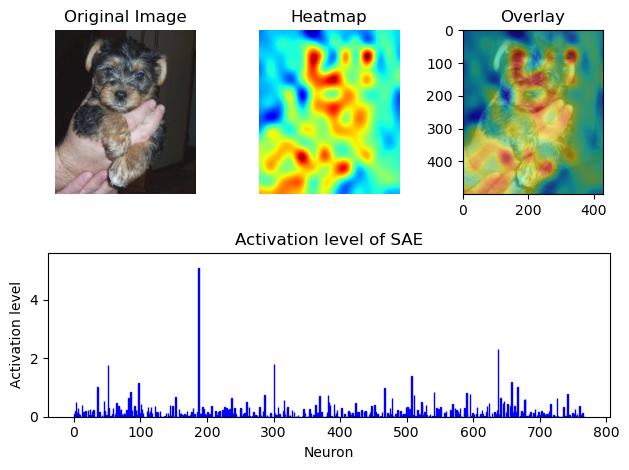

layer 1


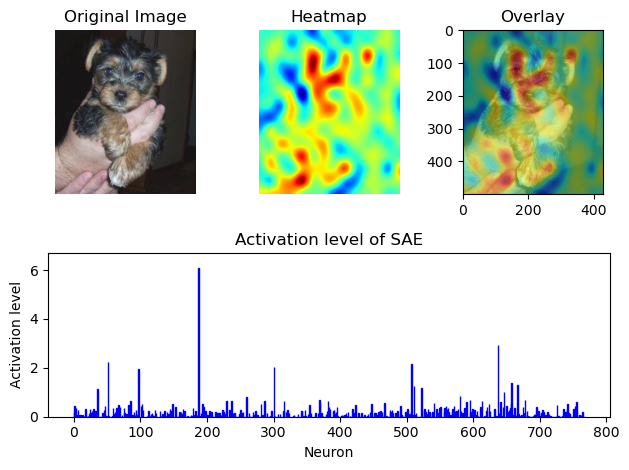

layer 2


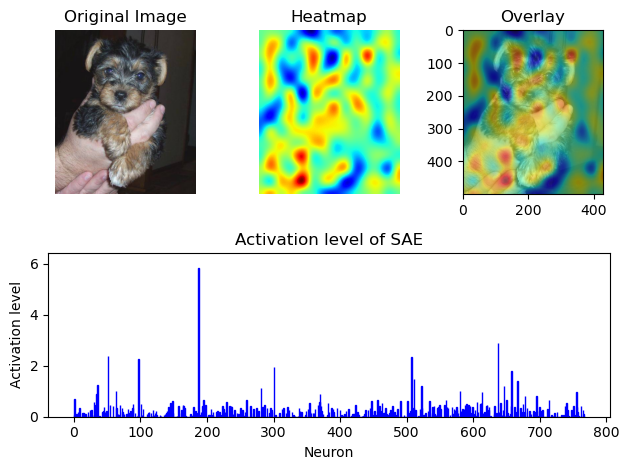

layer 3


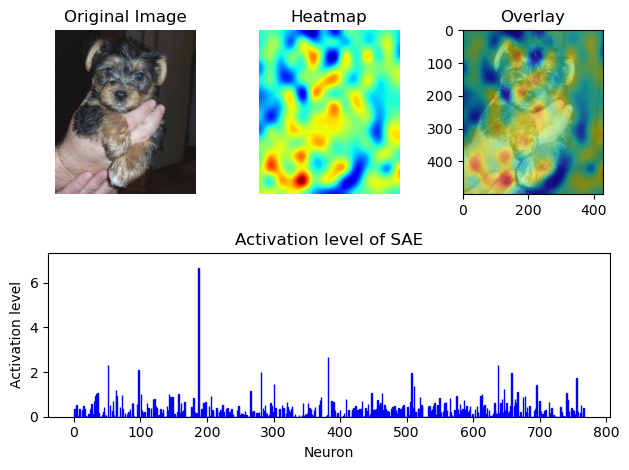

layer 4


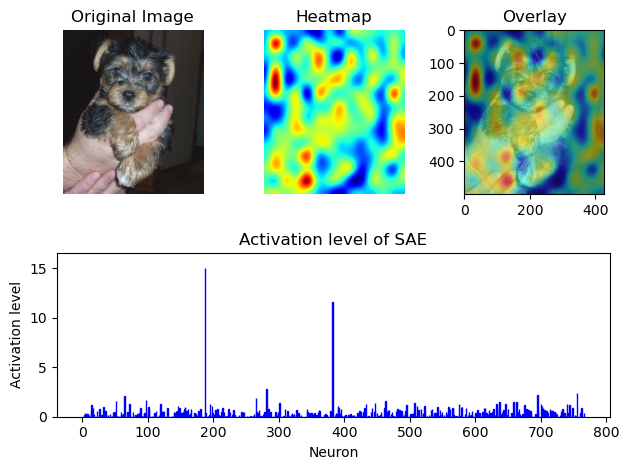

layer 5


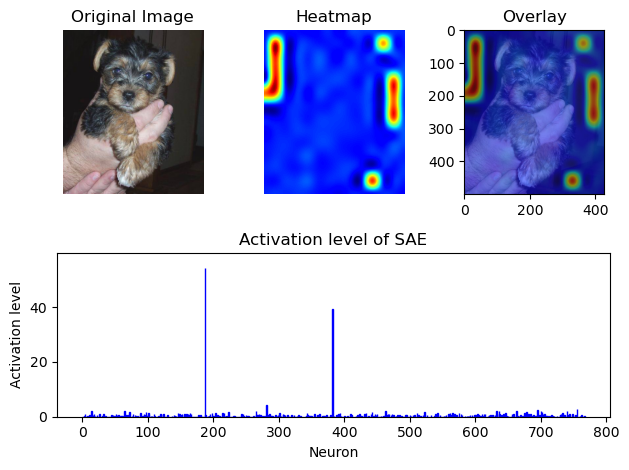

layer 6


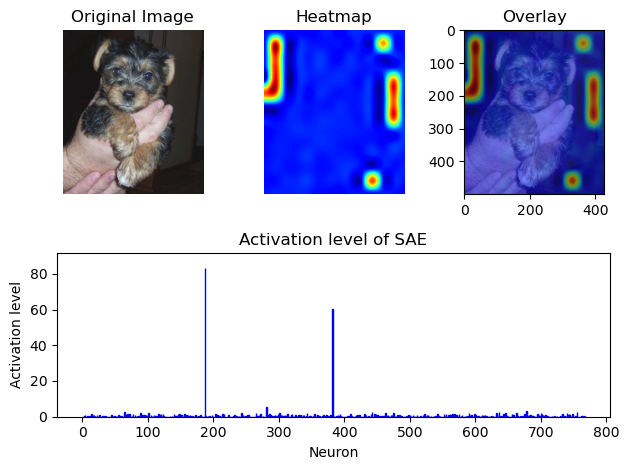

layer 7


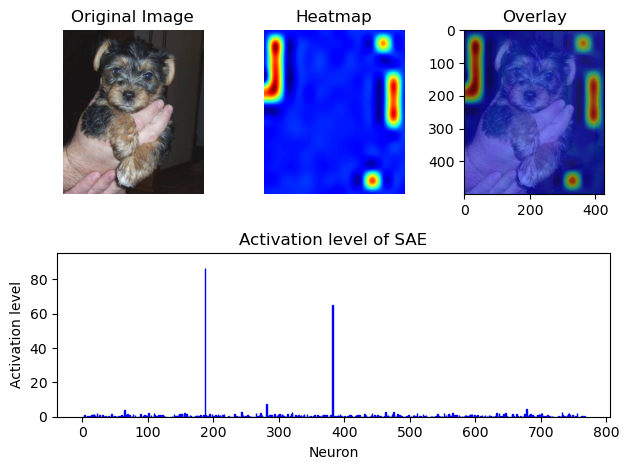

layer 8


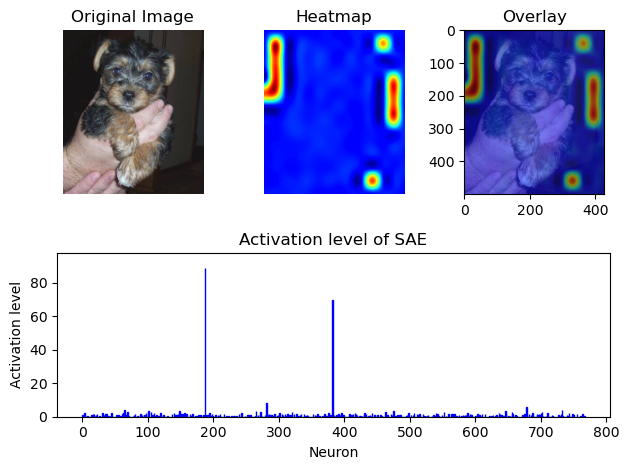

layer 9


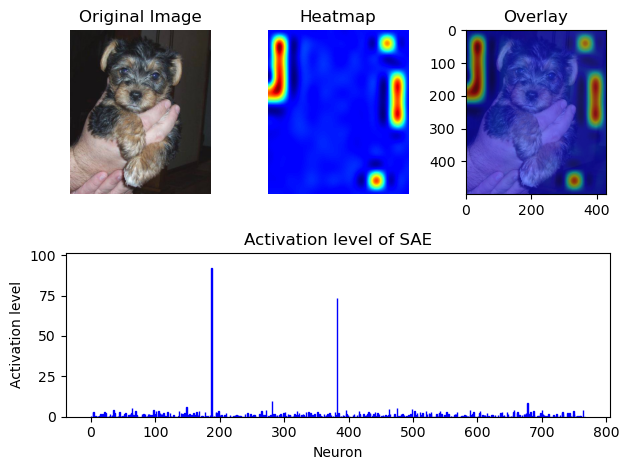

layer 10


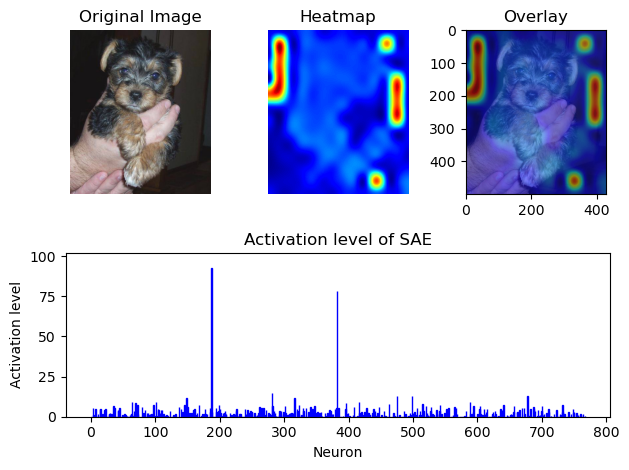

layer 11


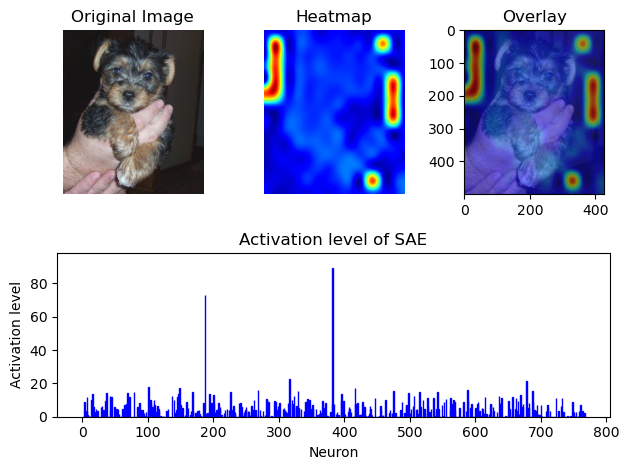

image 4
layer 0


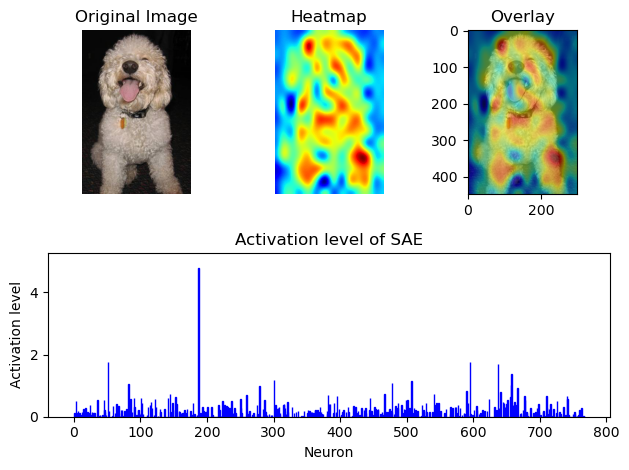

layer 1


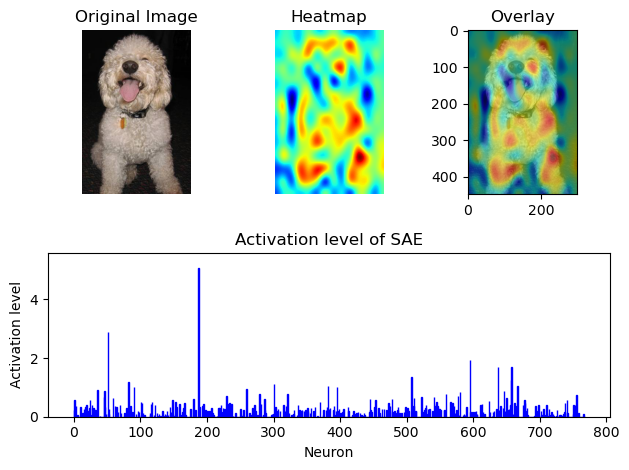

layer 2


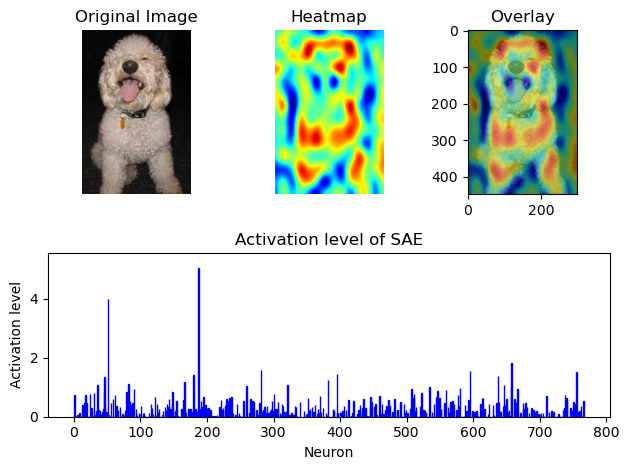

layer 3


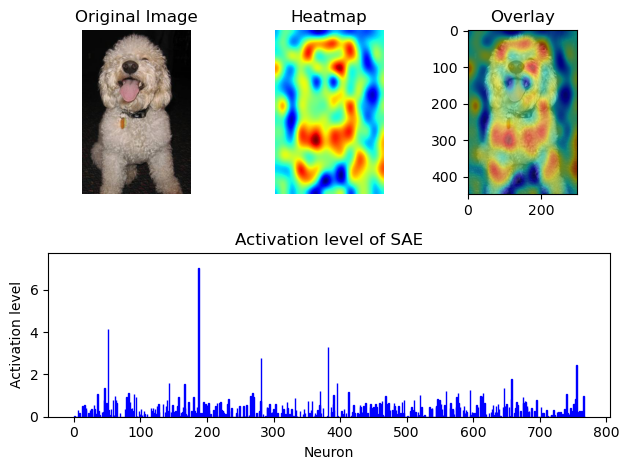

layer 4


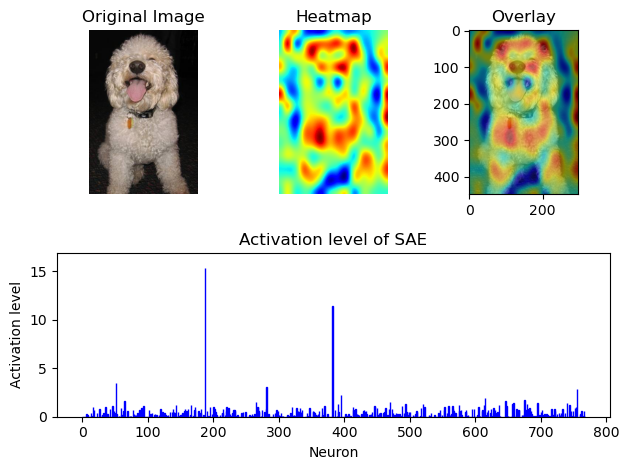

layer 5


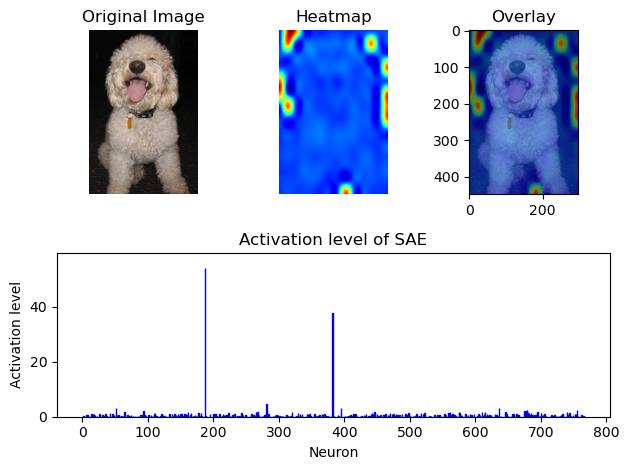

layer 6


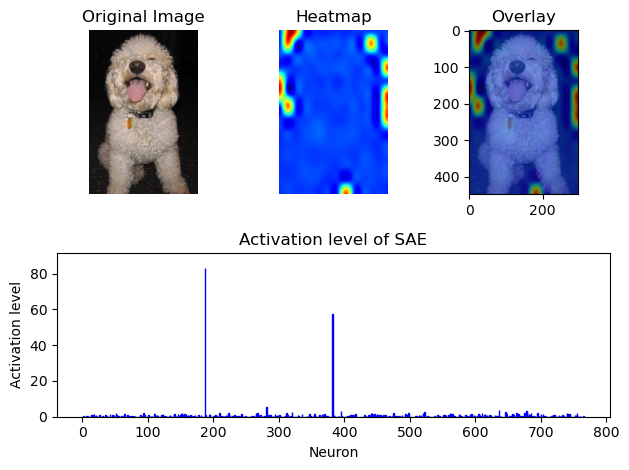

layer 7


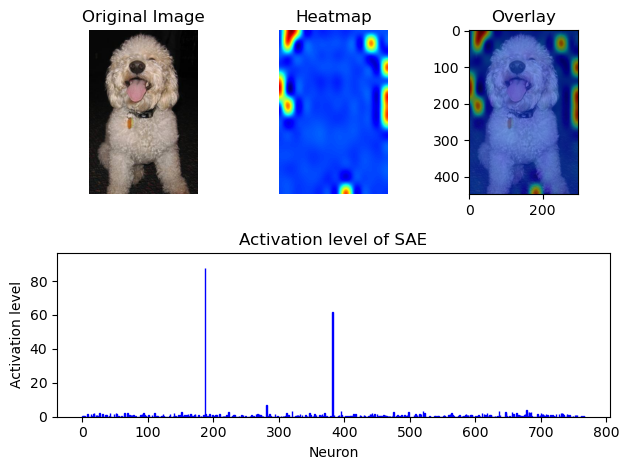

layer 8


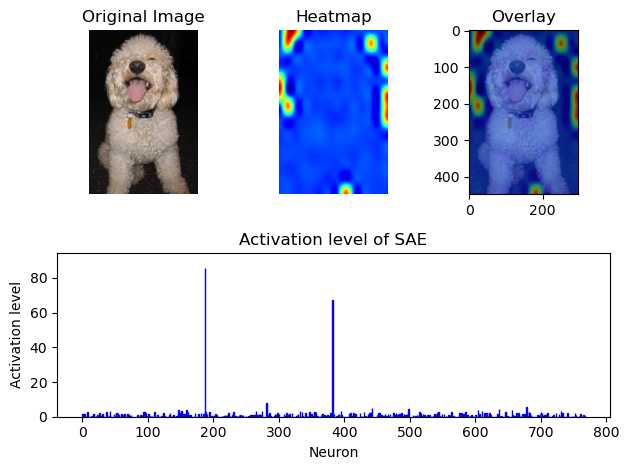

layer 9


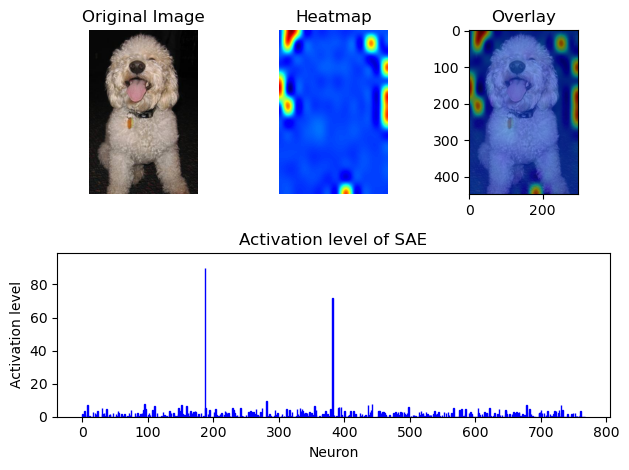

layer 10


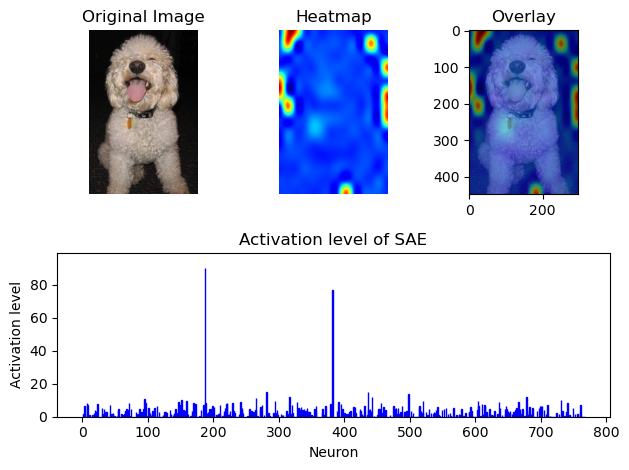

layer 11


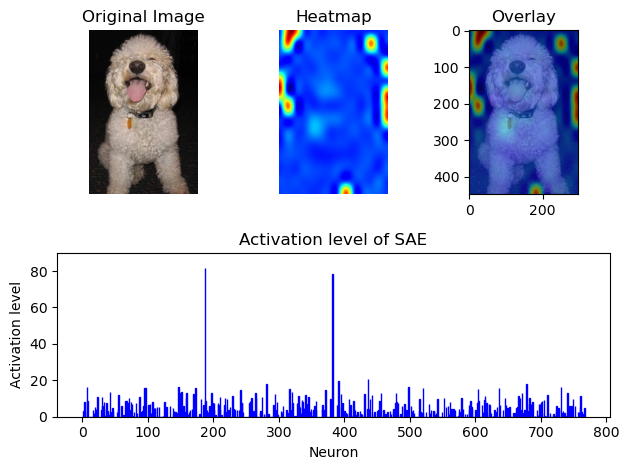

In [24]:
#run for all layers model ratio 10
for j in range(5):
    print(f'image {j}')
    for i in range(12):
        print(f'layer {i}')
        vit_activation(model, images[j],layer_number = i, device= device)

In [35]:
model(inputs[0].unsqueeze(0), output_hidden_states=True)['hidden_states'][1:][0].shape

torch.Size([1, 197, 768])

In [36]:
activations_1 = model(inputs[0].unsqueeze(0), output_hidden_states=True)['hidden_states'][1:]
activations_2 = model(inputs[1].unsqueeze(0), output_hidden_states=True)['hidden_states'][1:]
activations_3 = model(inputs[2].unsqueeze(0), output_hidden_states=True)['hidden_states'][1:]
activations_4 = model(inputs[3].unsqueeze(0), output_hidden_states=True)['hidden_states'][1:]
activations_5 = model(inputs[4].unsqueeze(0), output_hidden_states=True)['hidden_states'][1:]

top_features1 = []
top_features2 = []
top_features3 = []
top_features4 = []
top_features5 = []
for i in range(12):
    # Detach the tensors before passing them to torch.topk()
    tensor1 = activations_1[i].squeeze().mean(dim=0).detach().cpu()
    tensor2 = activations_2[i].squeeze().mean(dim=0).detach().cpu()
    tensor3 = activations_3[i].squeeze().mean(dim=0).detach().cpu()
    tensor4 = activations_4[i].squeeze().mean(dim=0).detach().cpu()
    tensor5 = activations_5[i].squeeze().mean(dim=0).detach().cpu()

    top_features1.append(torch.topk(tensor1, k=10, largest=True).indices)
    top_features2.append(torch.topk(tensor2, k=10, largest=True).indices)
    top_features3.append(torch.topk(tensor3, k=10, largest=True).indices)
    top_features4.append(torch.topk(tensor4, k=10, largest=True).indices)
    top_features5.append(torch.topk(tensor5, k=10, largest=True).indices)
    

print("Image 1")
[print(i) for i in top_features1]

print("Image 2")
[print(i) for i in top_features2]

print("Image 3")
[print(i) for i in top_features3]

print("Image 4")
[print(i) for i in top_features4]

print("Image 5")
[print(i) for i in top_features5]

Image 1
tensor([187, 507, 301, 637,  51, 658, 541, 395, 286, 250])
tensor([187, 507,  51, 301, 561, 637, 658, 286,   1, 595])
tensor([187,  51, 507, 301, 561,   1, 637, 658, 286, 595])
tensor([187,  51, 507, 301, 561,  63, 382, 206, 512, 731])
tensor([187, 382,  51, 507, 301, 561,  63, 731, 695, 206])
tensor([187, 382, 301,  51, 561, 731, 678, 695, 281, 507])
tensor([187, 382, 678, 281, 301, 512, 732,  64,  92, 636])
tensor([187, 382, 678, 281,  64, 243, 732,  18, 728, 522])
tensor([187, 382, 678, 281, 682, 243, 728, 604, 733, 347])
tensor([187, 382, 678, 281, 328, 498,  18, 243, 475,  89])
tensor([187, 382, 678, 281, 498,  18, 475, 700, 682, 520])
tensor([187, 382,  18, 712, 719, 439, 683, 592, 687, 413])
Image 2
tensor([187, 507,  82, 259, 595, 467, 153, 279, 667, 301])
tensor([187, 507,  82, 259, 301, 755, 595, 511, 741, 667])
tensor([187, 507,  82, 755, 511, 658, 301, 259,  51, 646])
tensor([187, 507, 382, 755,  63, 511, 658,  82, 646, 123])
tensor([187, 382, 755,  63, 507, 511, 65

[None, None, None, None, None, None, None, None, None, None, None, None]

In [37]:
top_indices1 = get_top_indices(top_features1)
top_indices2 = get_top_indices(top_features2)
top_indices3 = get_top_indices(top_features3)
top_indices4 = get_top_indices(top_features4)
top_indices5 = get_top_indices(top_features5)

print(top_indices1)
print(top_indices2)
print(top_indices3)
print(top_indices4)
print(top_indices5)

[187, 382, 301, 507, 51, 678, 281, 561, 18, 637]
[187, 382, 678, 507, 82, 755, 511, 63, 442, 281]
[187, 97, 382, 637, 281, 507, 301, 561, 511, 678]
[187, 382, 281, 64, 678, 51, 97, 463, 637, 301]
[187, 382, 281, 678, 51, 395, 658, 755, 646, 636]


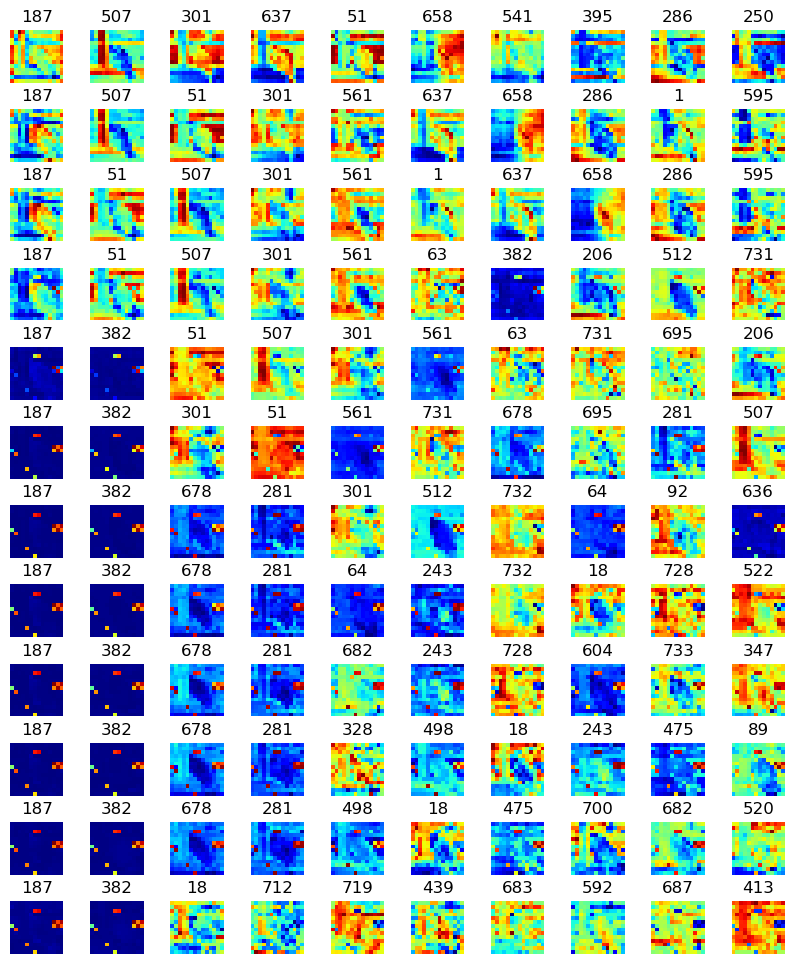

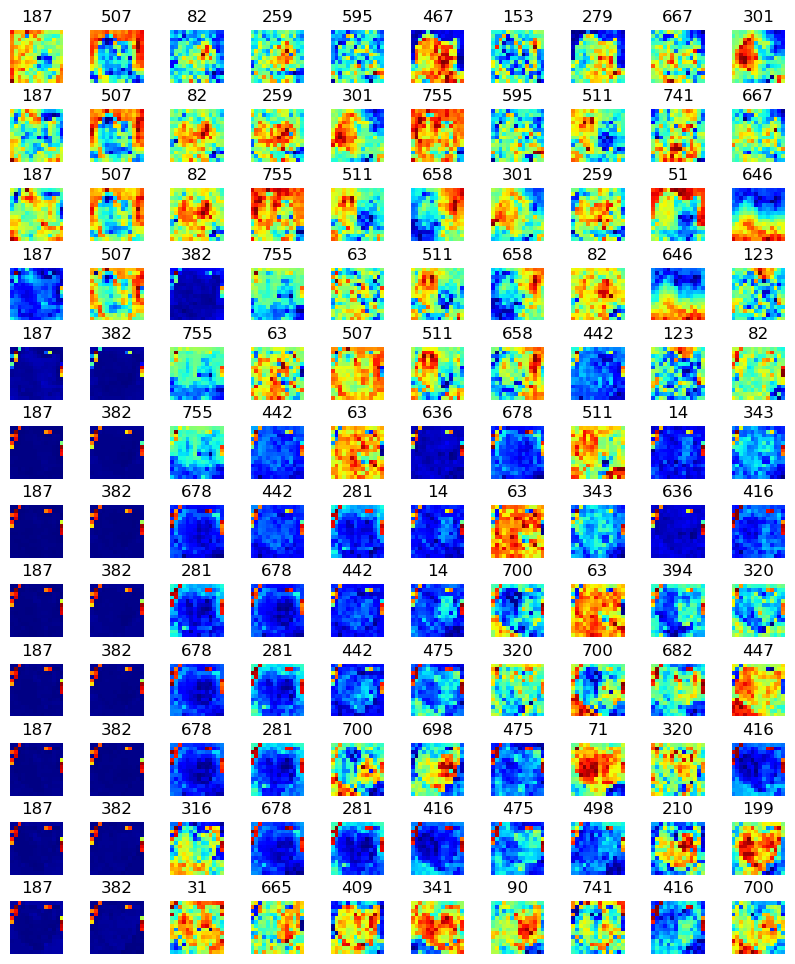

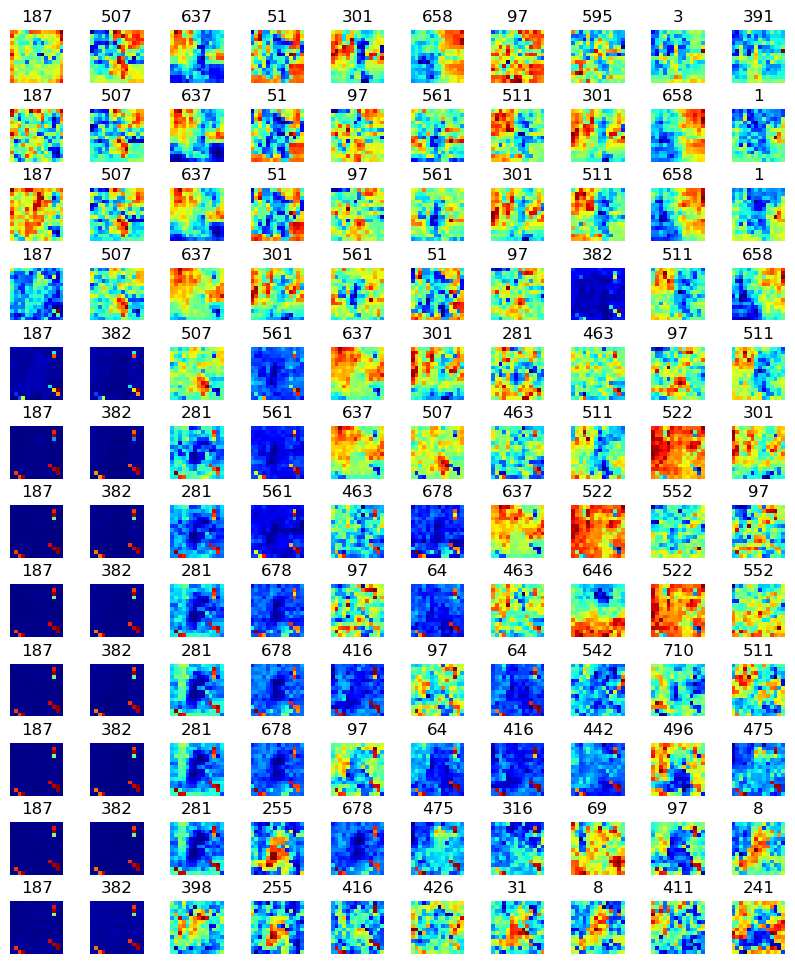

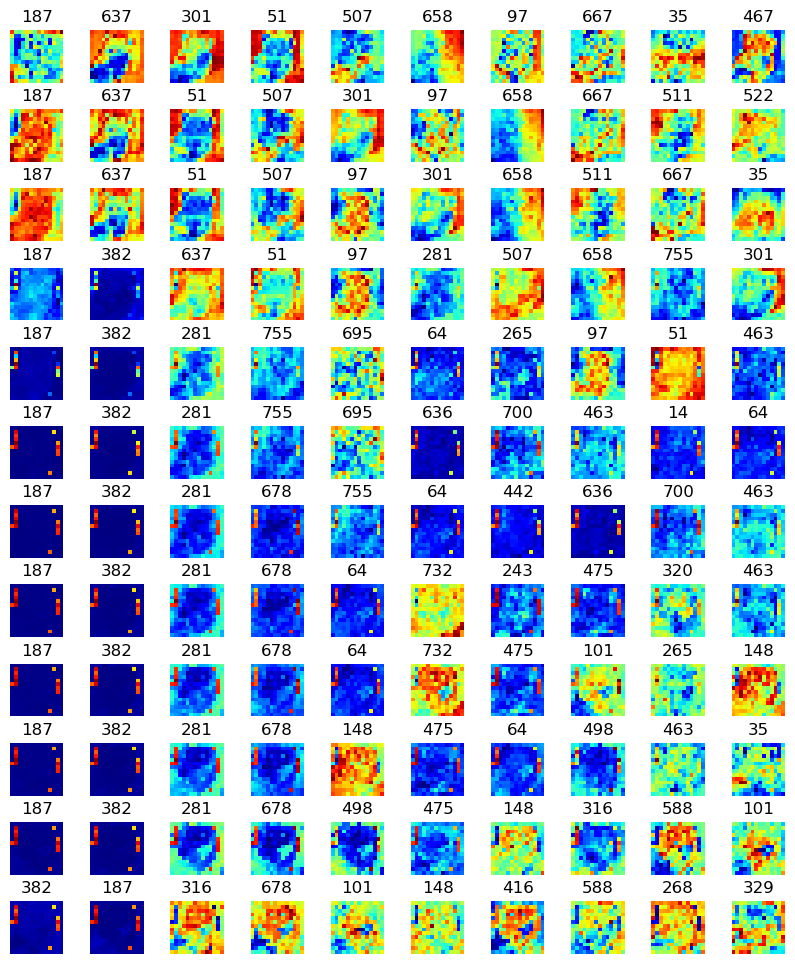

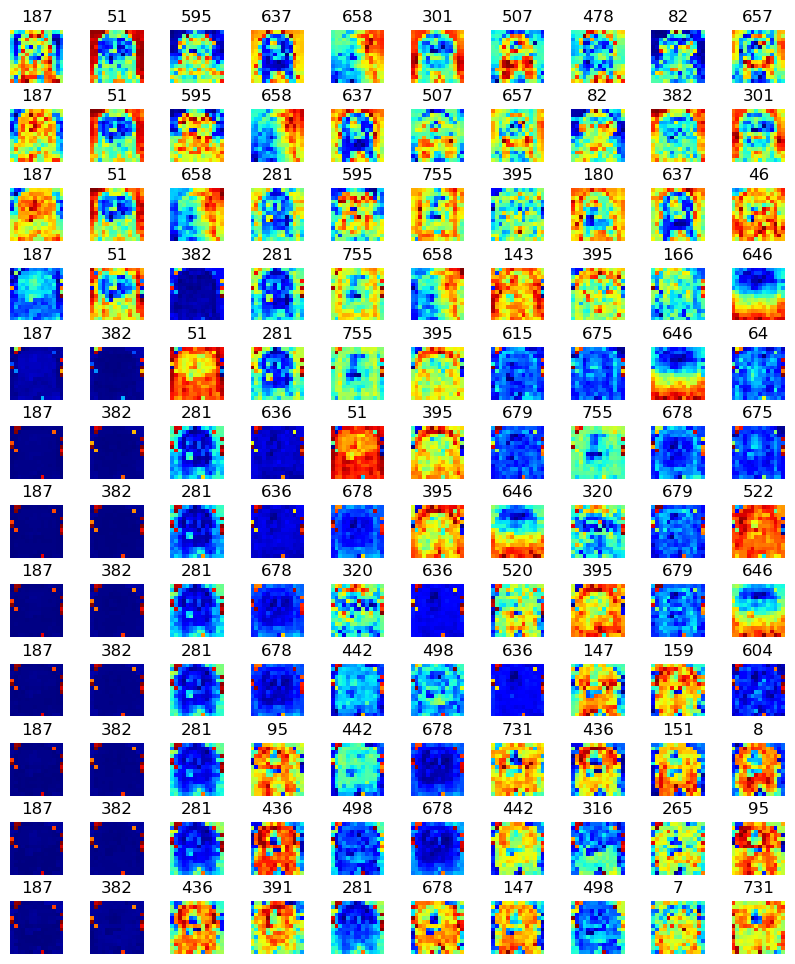

In [38]:

create_heatmap(activations_1, top_features1)
create_heatmap(activations_2, top_features2)
create_heatmap(activations_3, top_features3)
create_heatmap(activations_4, top_features4)
create_heatmap(activations_5, top_features5)